In [1]:
import cv2 as cv
import numpy as np
import glob
import pickle
import ml_metrics
import math
import os
import yaml
from evaluation_funcs import performance_accumulation_pixel 
from evaluation_funcs import performance_evaluation_pixel
from matplotlib import pyplot as plt

#Show images in horizontal
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

In [2]:
def showImagesHorizontally(list_of_files, titles):
    fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
    #fig = figure()
    number_of_files = len(list_of_files)
    j=0
    for i in range(number_of_files):
        
        a = fig.add_subplot(1,number_of_files,i+1)
        image = list_of_files[i]
        imshow(image,cmap='Greys_r')
        ax1 = axis('off')
        a.set_title(titles[j])
        a.set_xlabel(np.shape(image))
        j = j+1
        


In [3]:
def show_img_cs(img,colorspace):
    plt.imshow(img, colorspace)
    plt.show()
    
def show_img_gray(img, title):
    print(title)
    plt.imshow(img, cmap = plt.cm.gray)
    plt.show()
    
def show_img_gray(img):
    plt.imshow(img, cmap = plt.cm.gray)
    plt.show()
    
def show_img(img, title):
    print(title)
    plt.imshow(img)
    plt.show()
    
def show_img(img):
    plt.imshow(img)
    plt.show()

F-measure: 0.9325212275801232


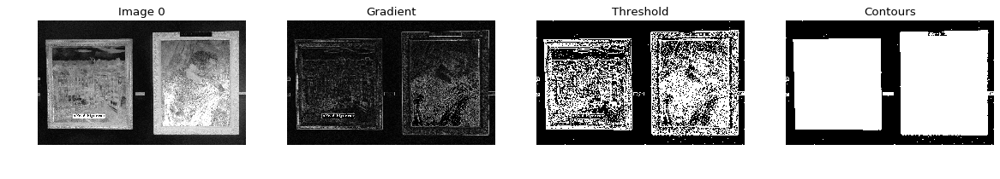

<Figure size 432x288 with 0 Axes>

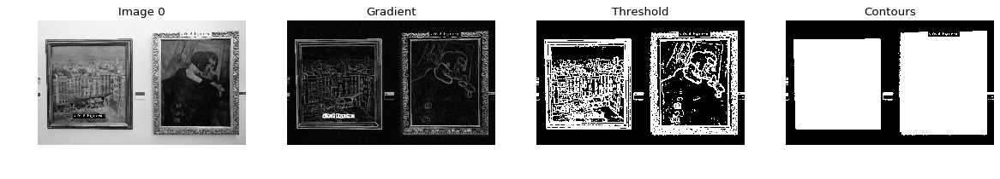

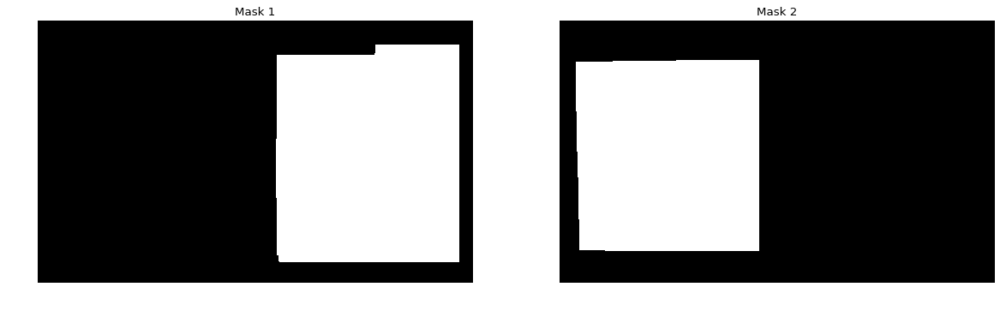

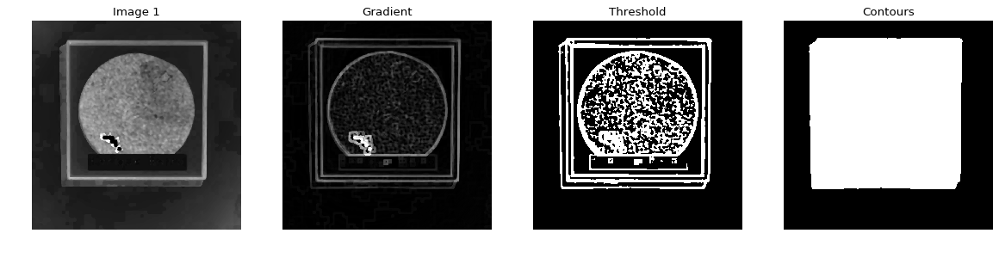

<Figure size 432x288 with 0 Axes>

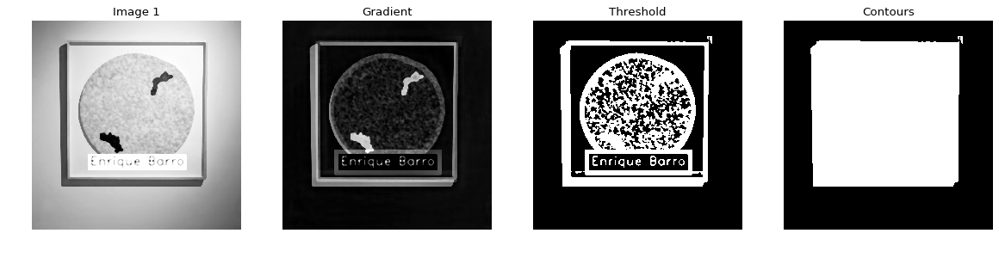

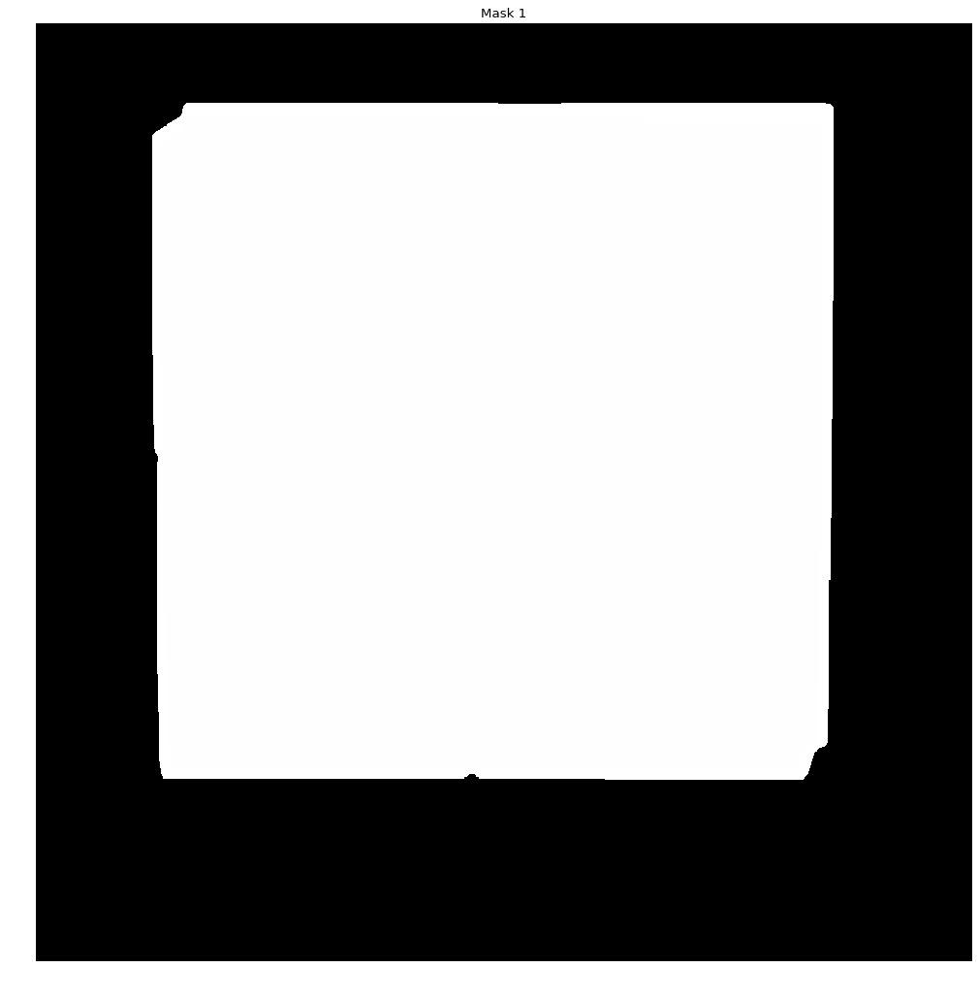

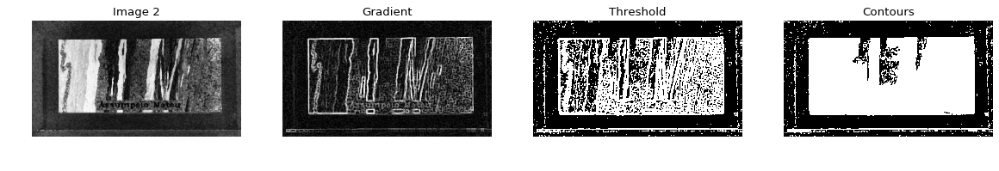

<Figure size 432x288 with 0 Axes>

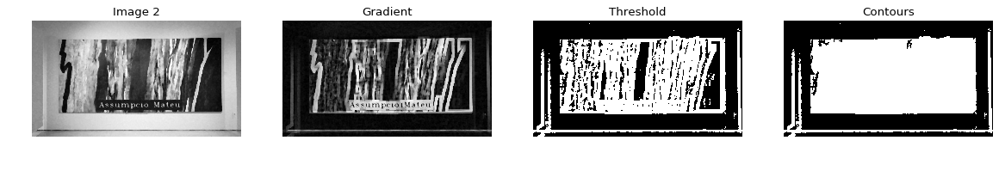

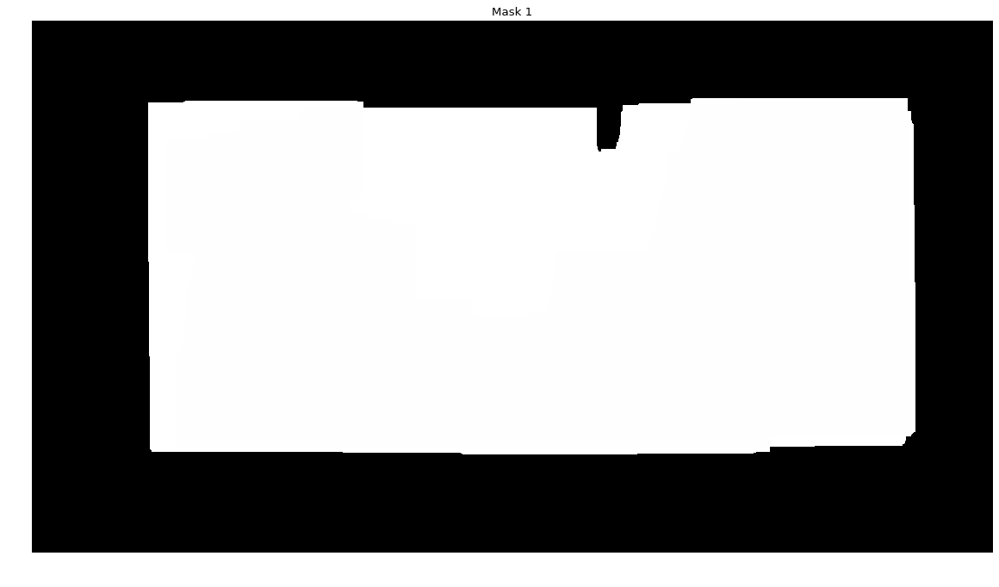

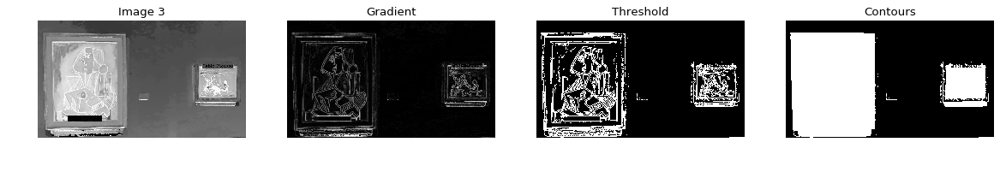

<Figure size 432x288 with 0 Axes>

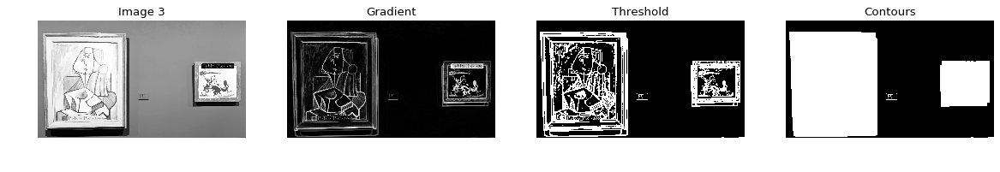

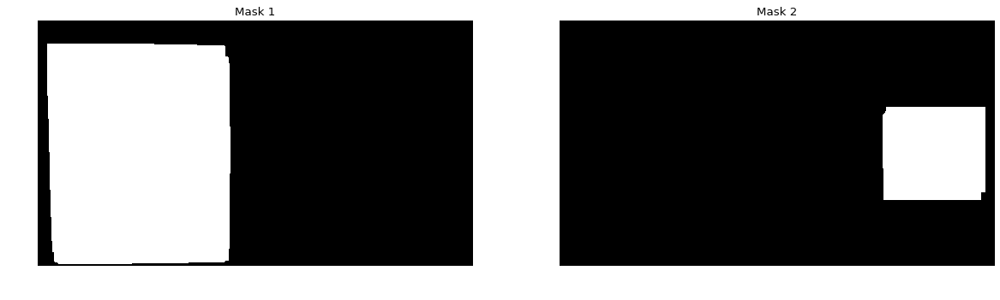

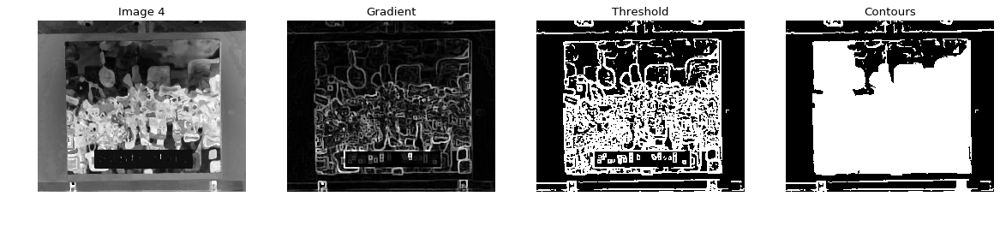

<Figure size 432x288 with 0 Axes>

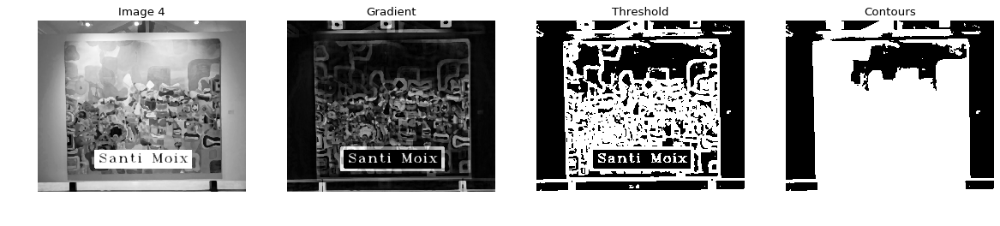

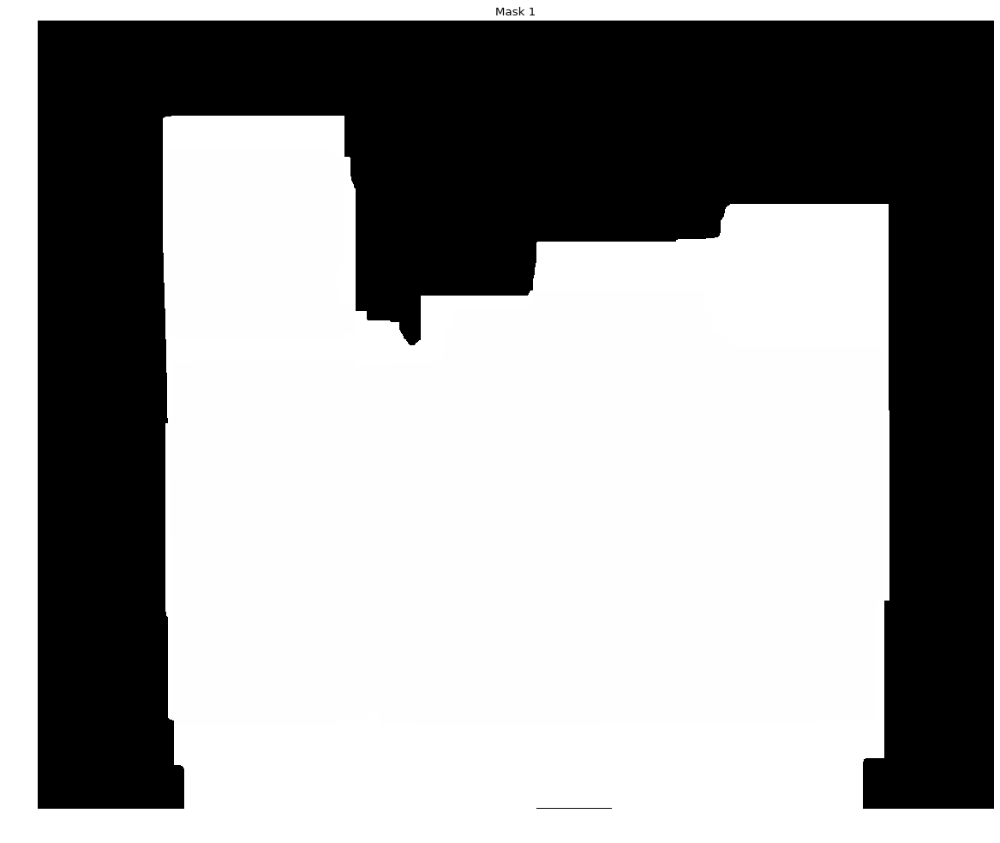

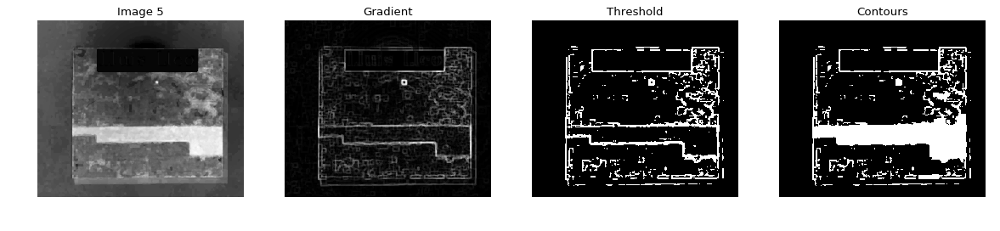

<Figure size 432x288 with 0 Axes>

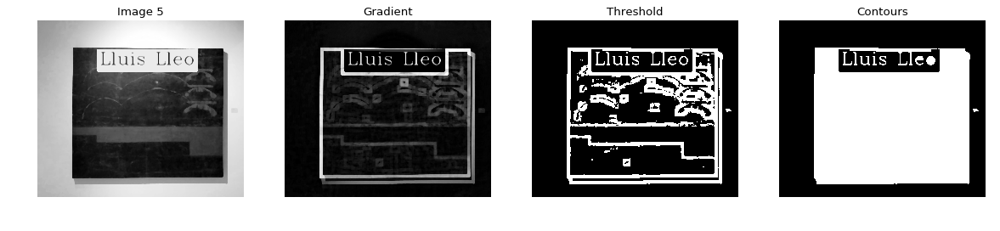

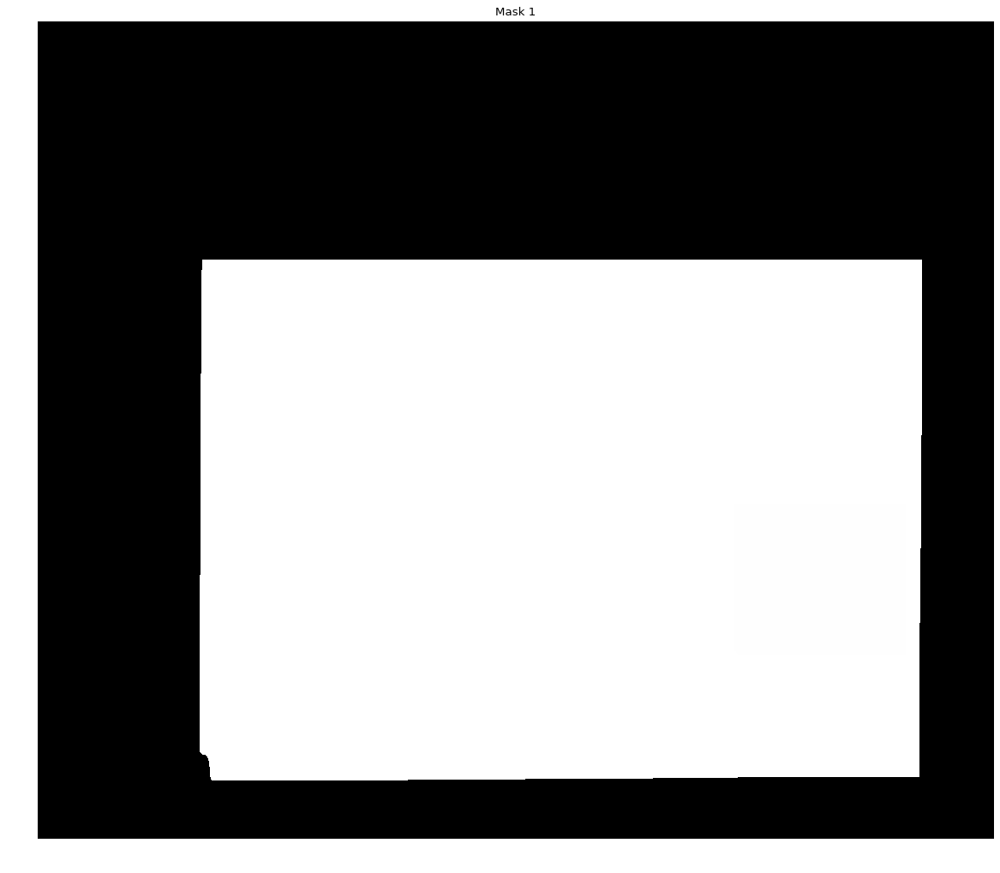

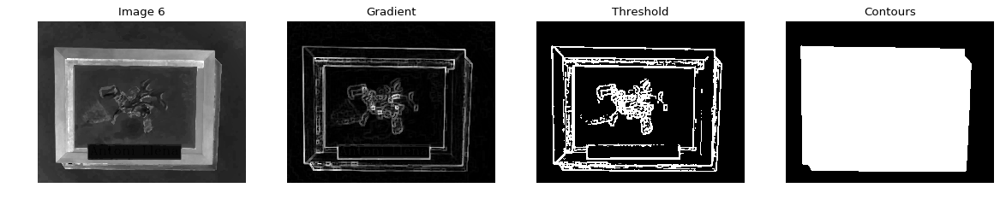

<Figure size 432x288 with 0 Axes>

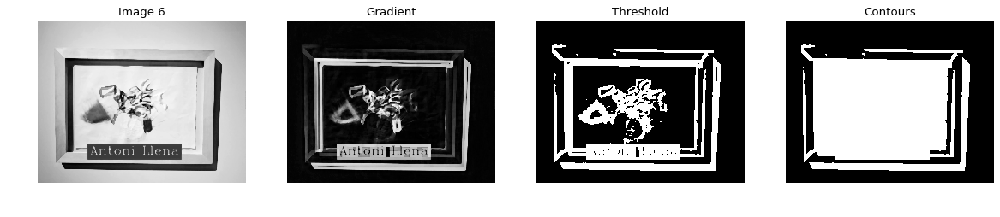

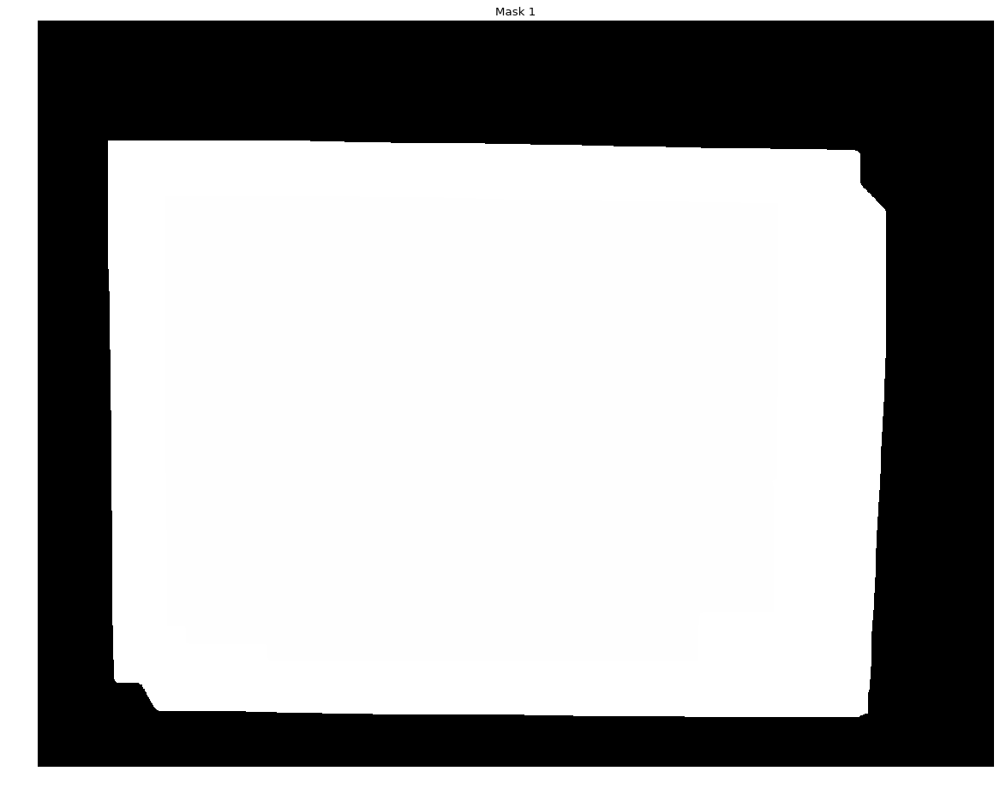

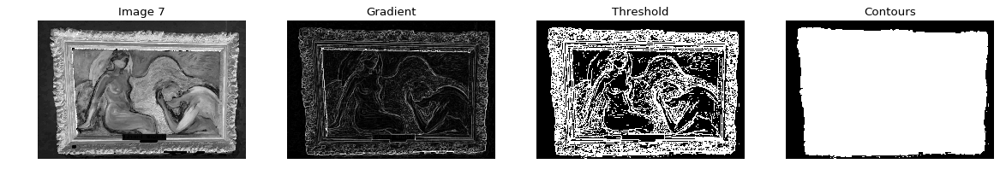

<Figure size 432x288 with 0 Axes>

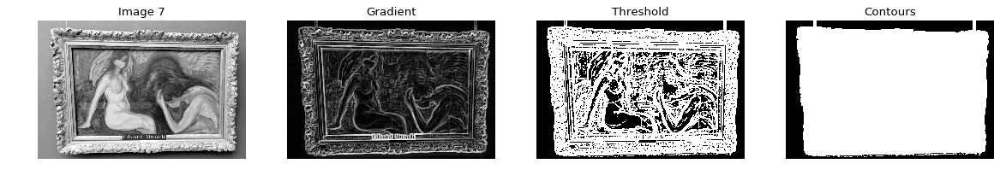

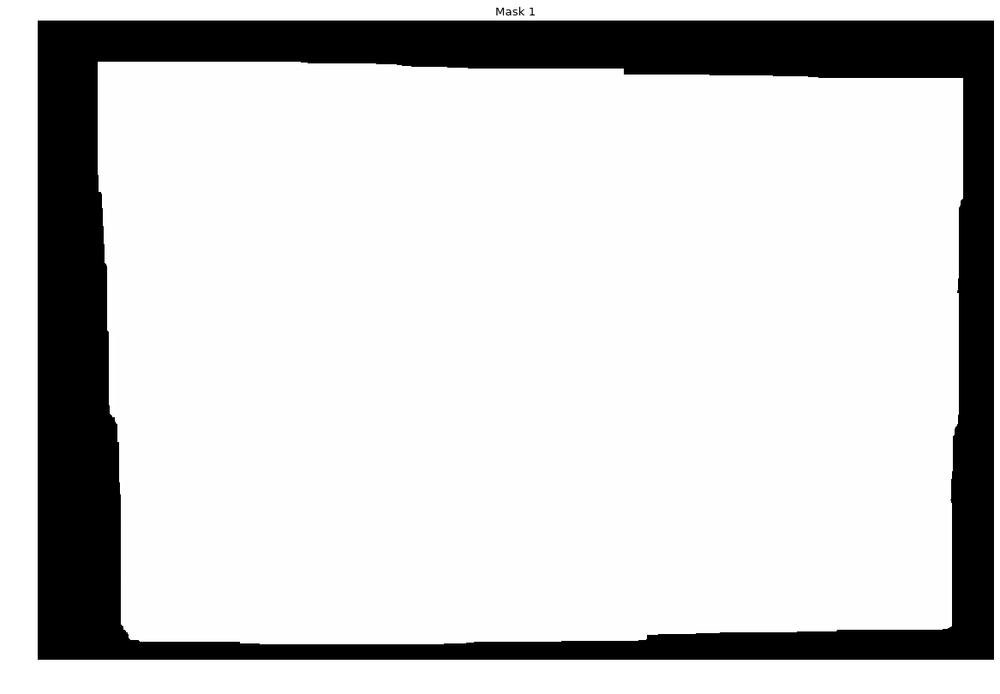

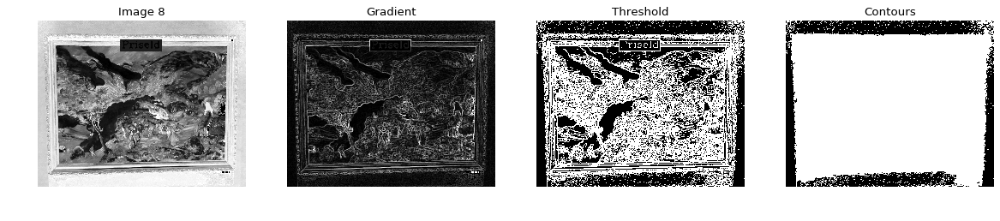

<Figure size 432x288 with 0 Axes>

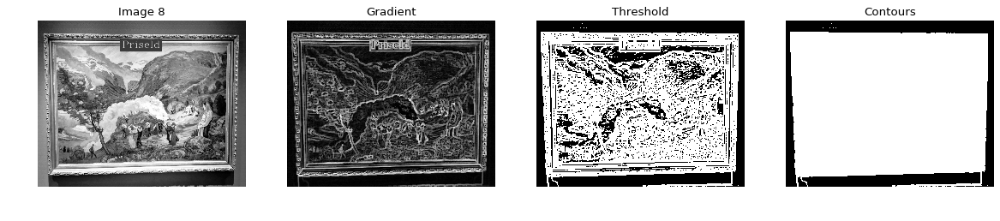

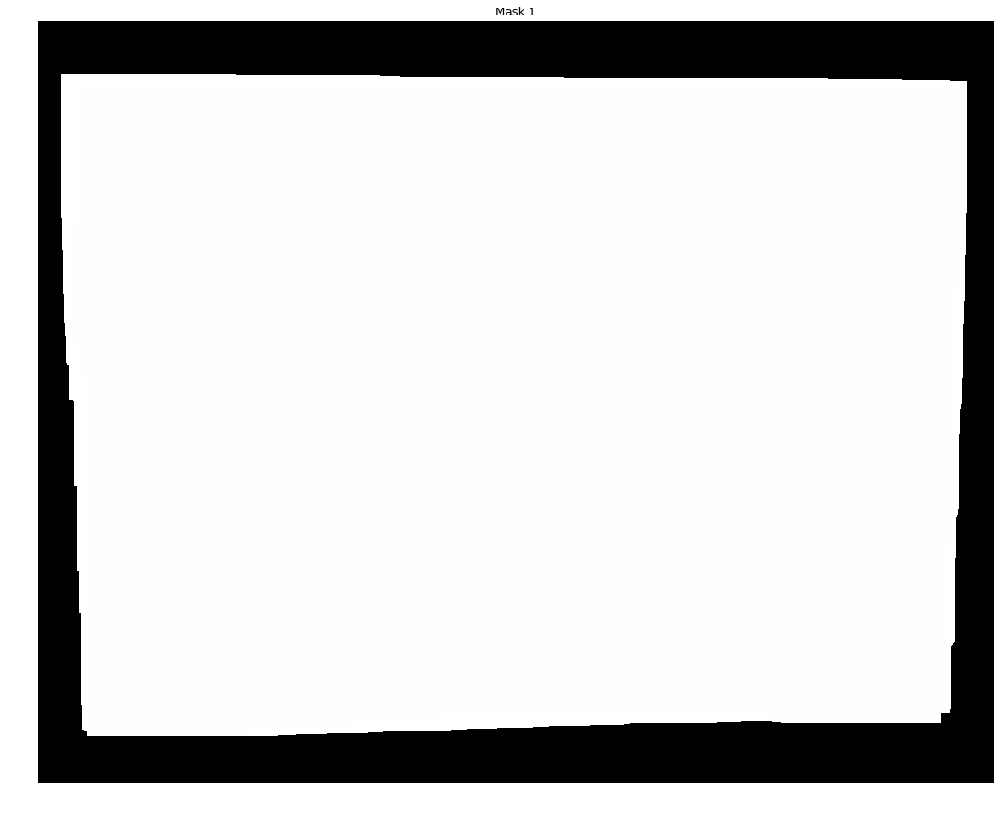

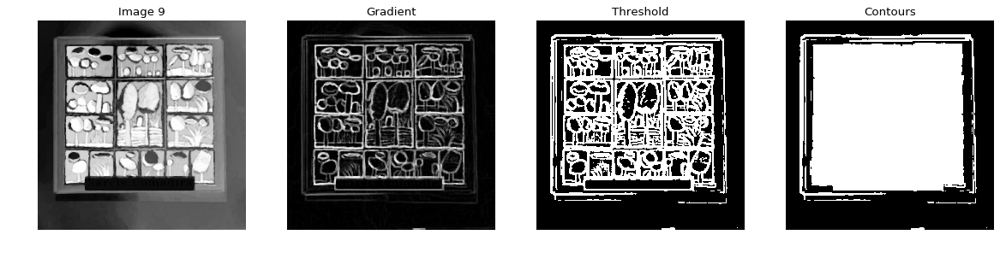

<Figure size 432x288 with 0 Axes>

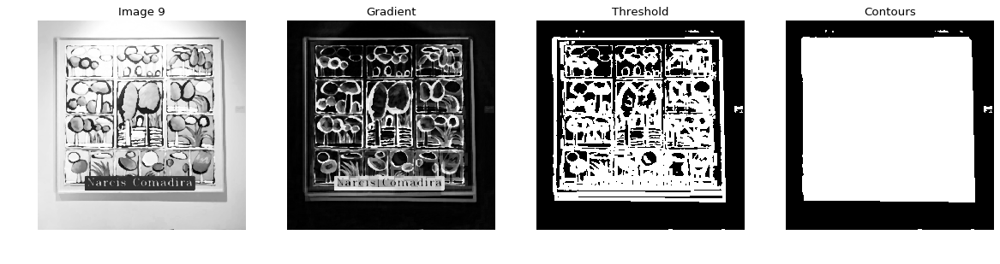

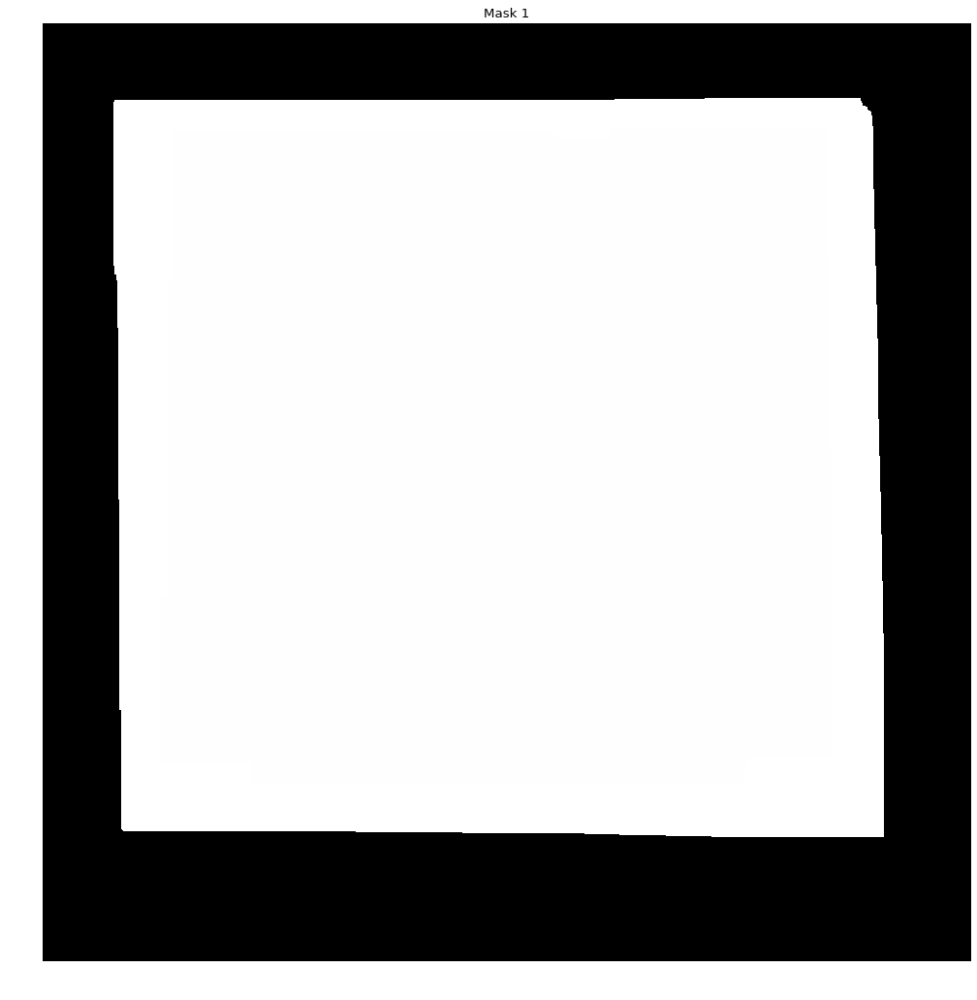

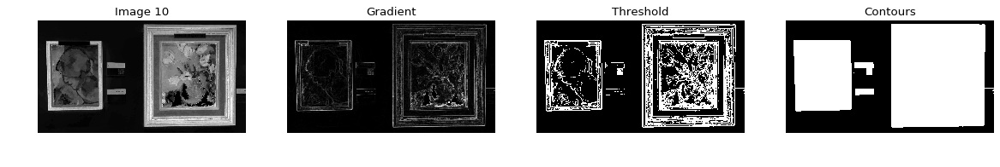

<Figure size 432x288 with 0 Axes>

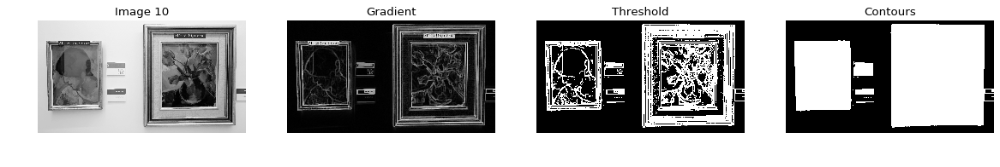

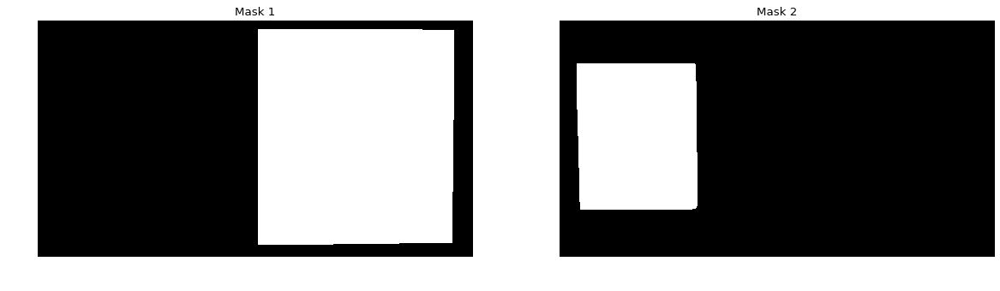

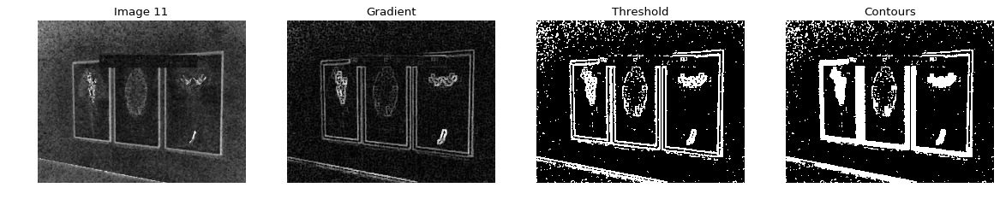

<Figure size 432x288 with 0 Axes>

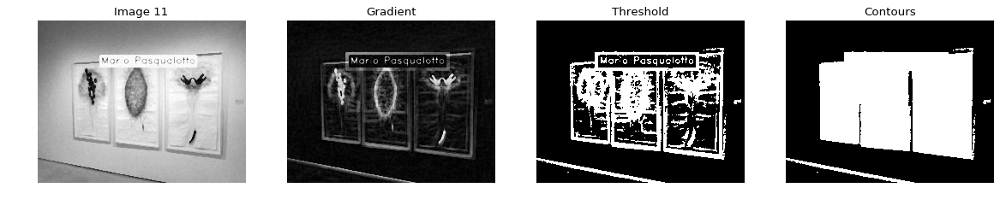

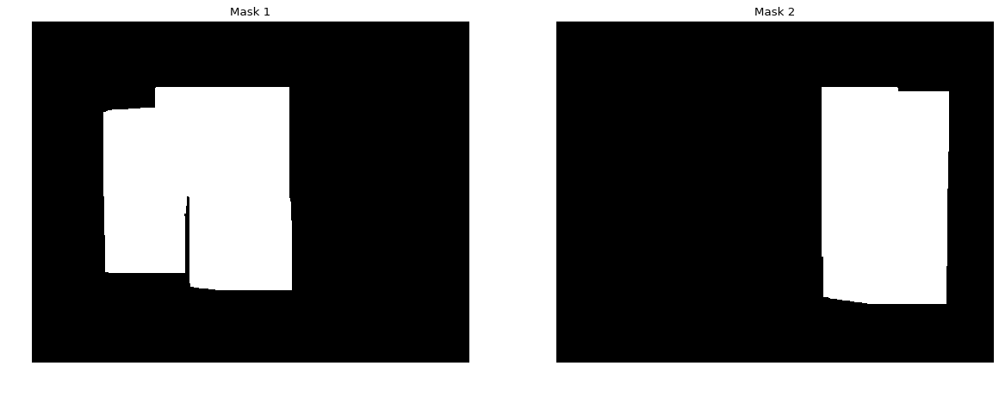

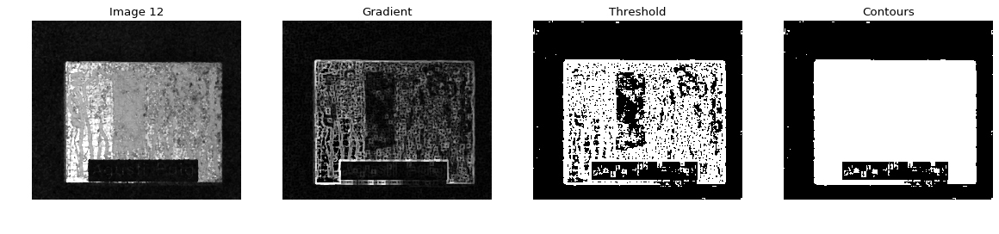

<Figure size 432x288 with 0 Axes>

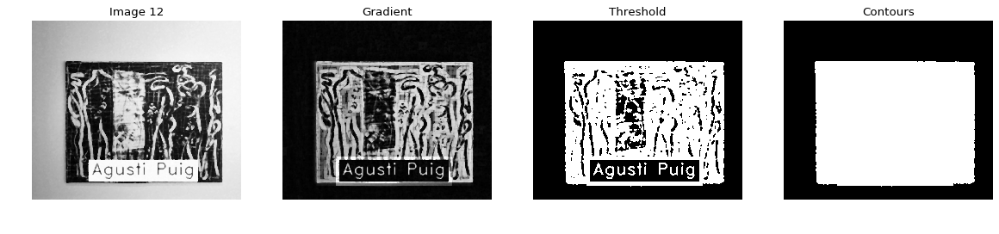

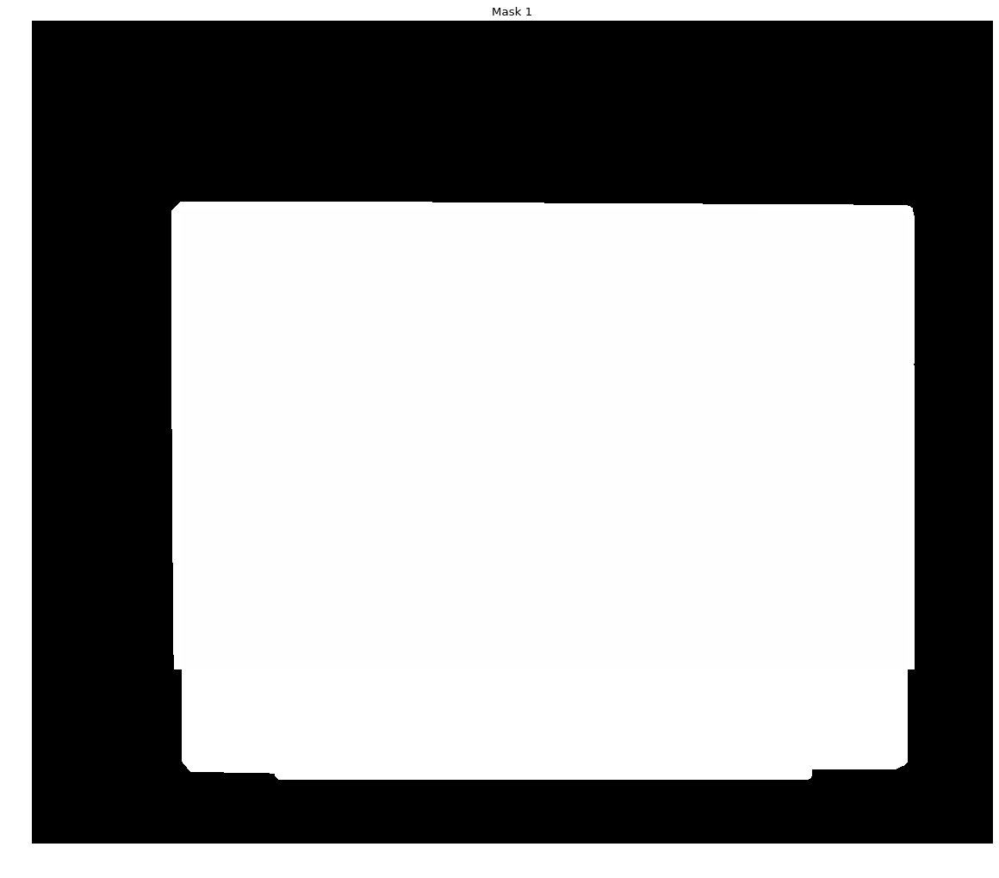

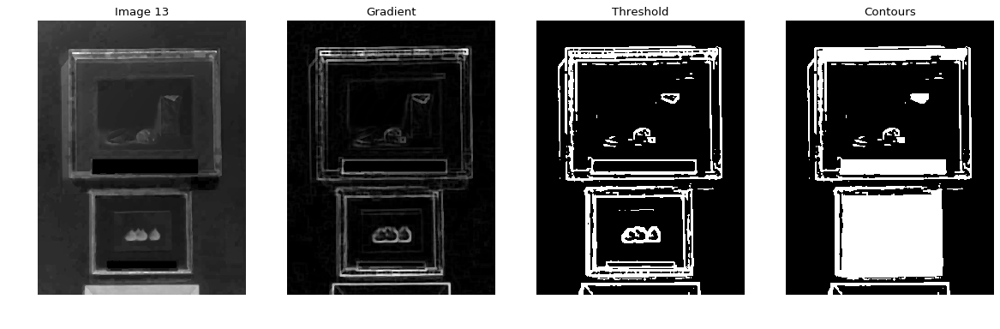

<Figure size 432x288 with 0 Axes>

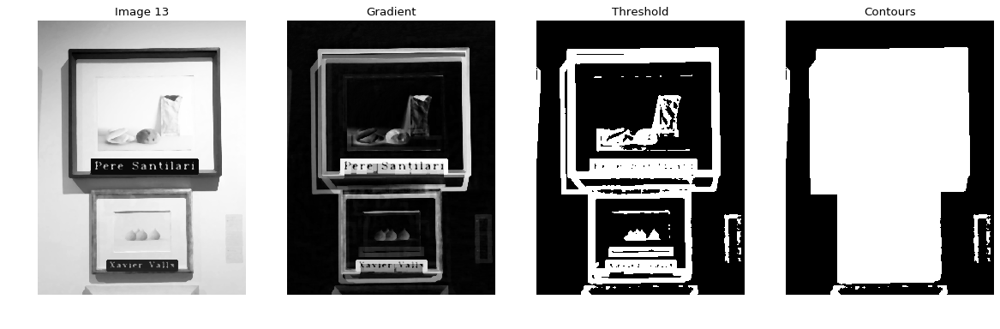

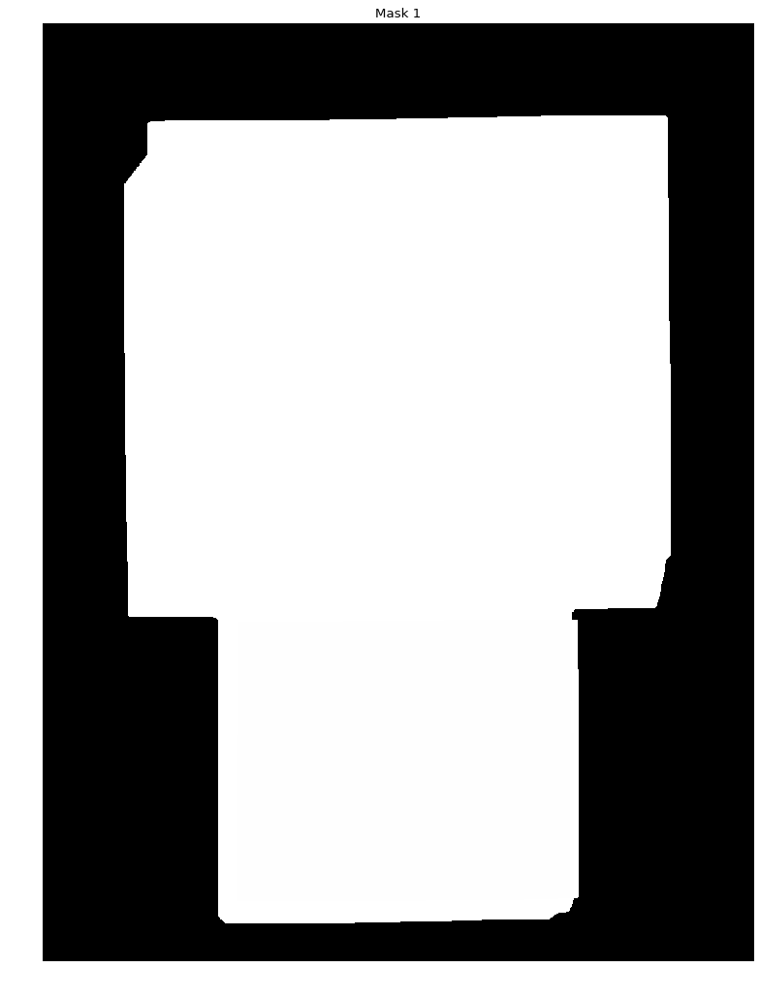

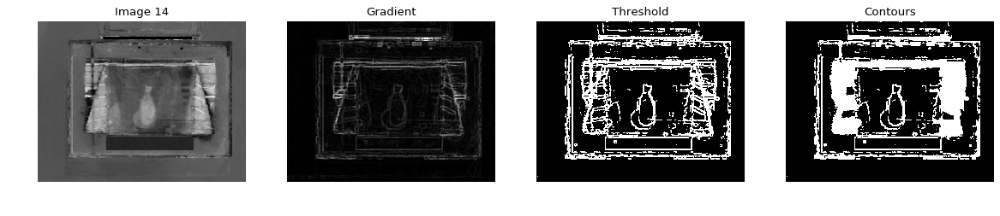

<Figure size 432x288 with 0 Axes>

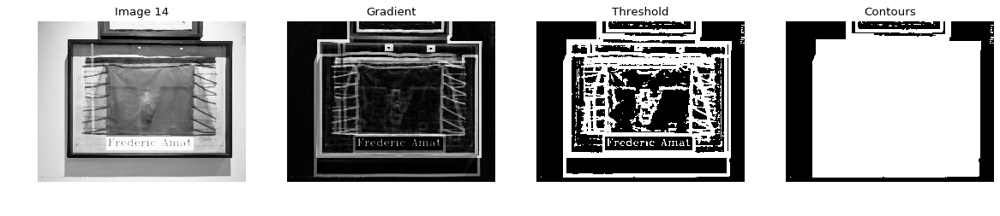

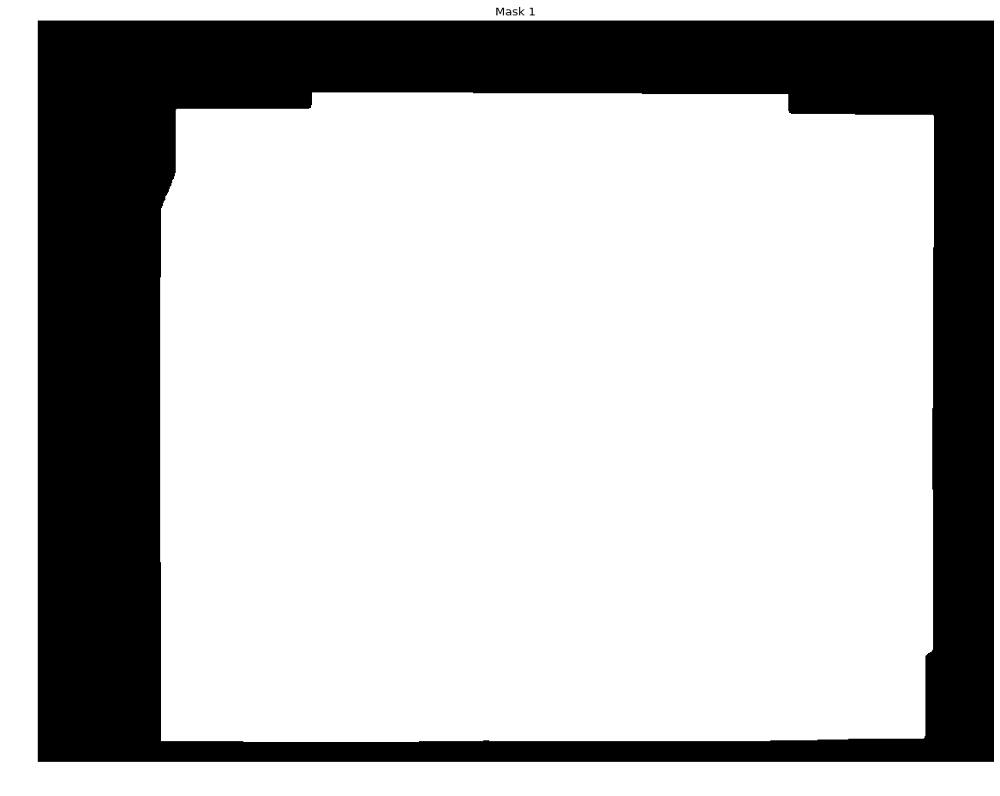

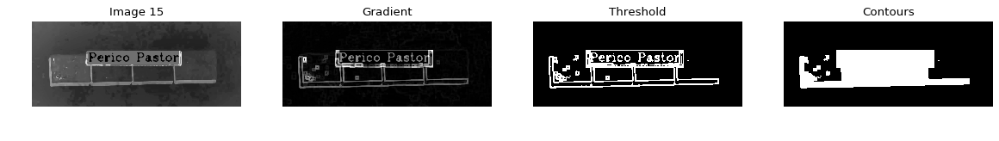

<Figure size 432x288 with 0 Axes>

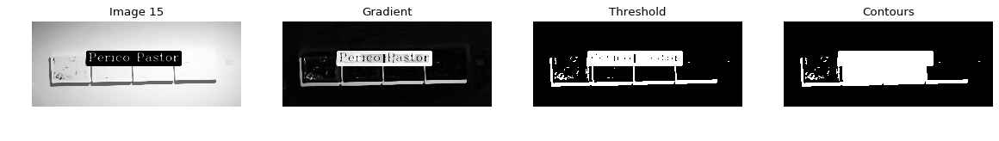

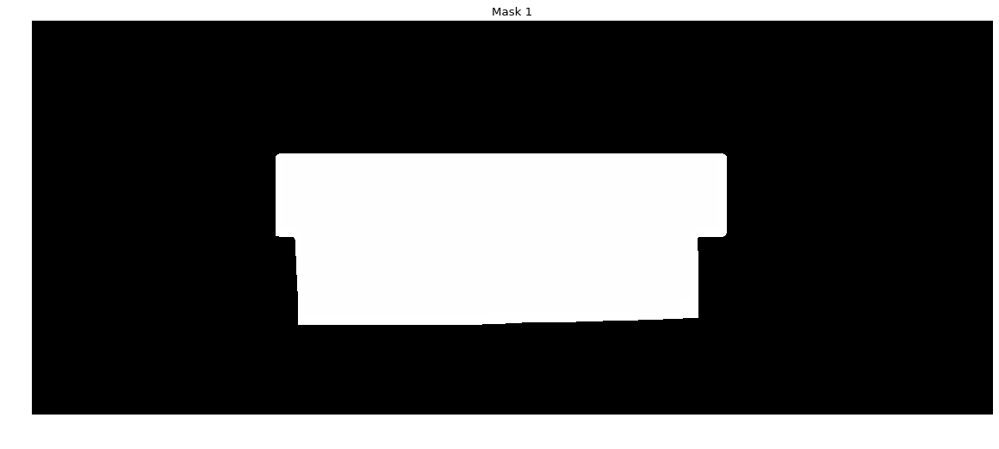

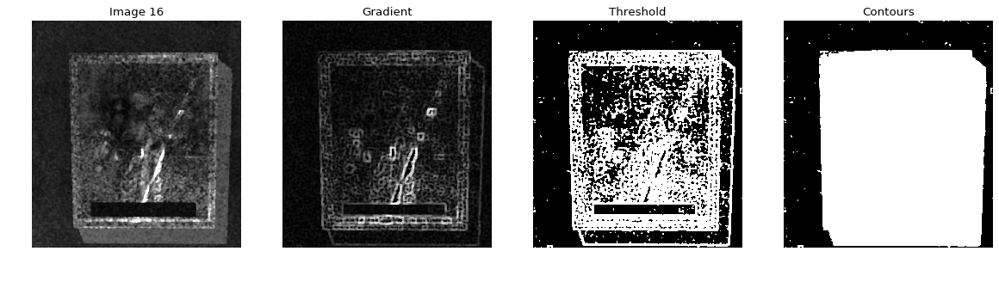

<Figure size 432x288 with 0 Axes>

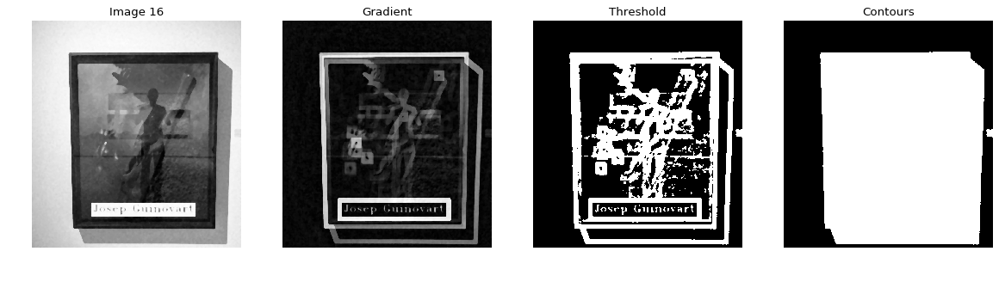

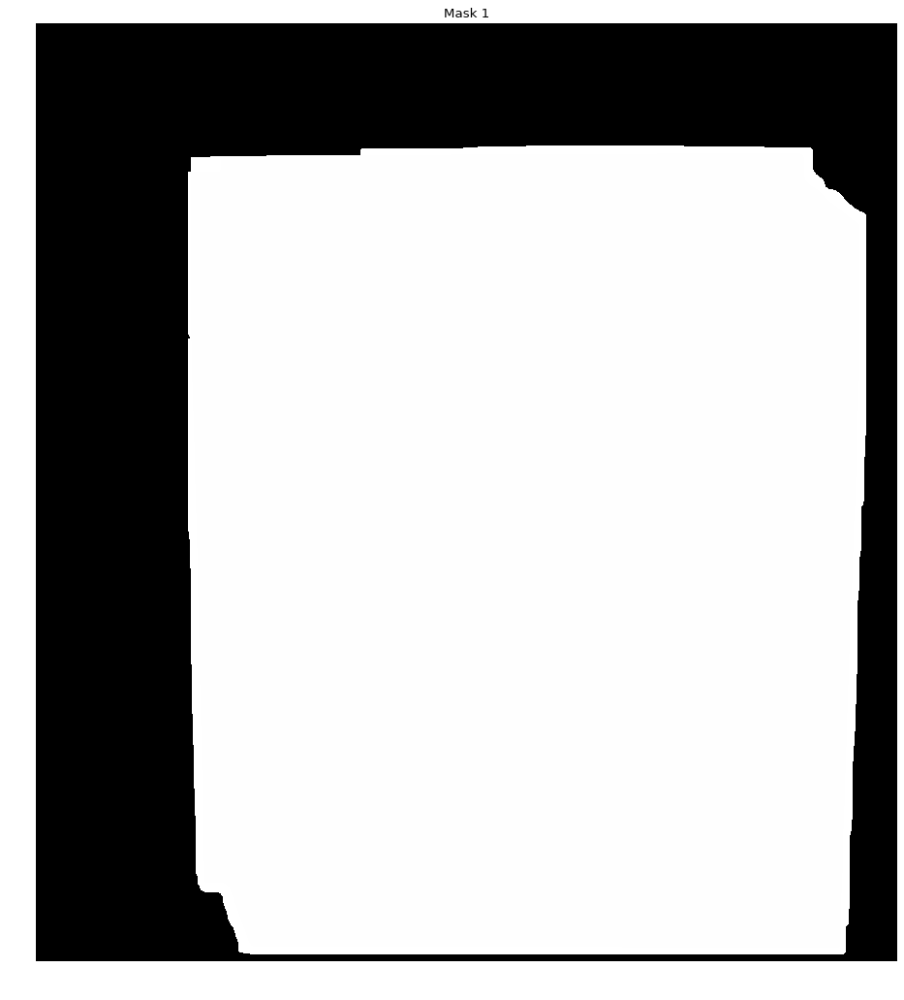

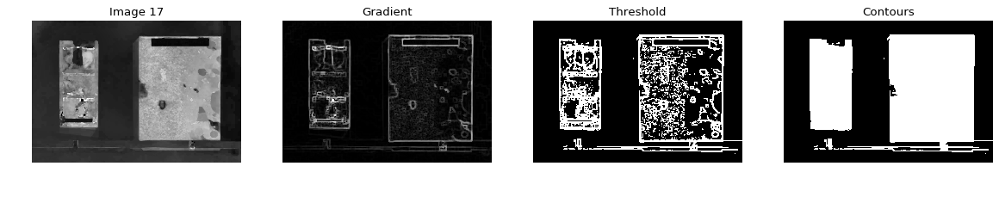

<Figure size 432x288 with 0 Axes>

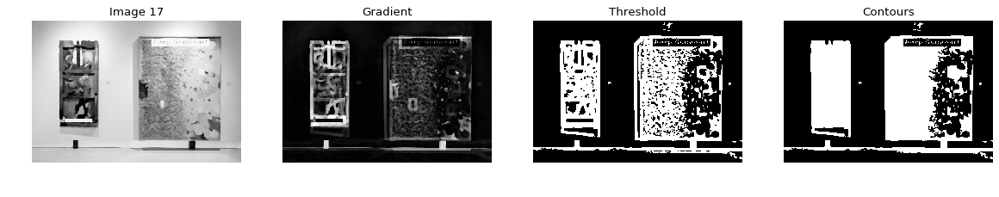

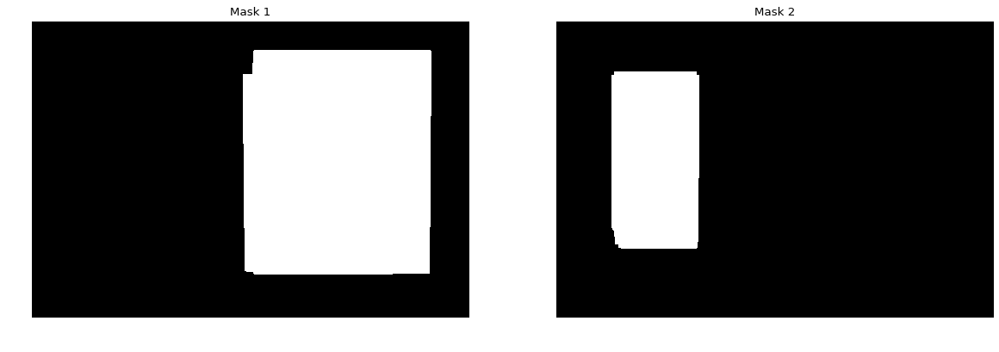

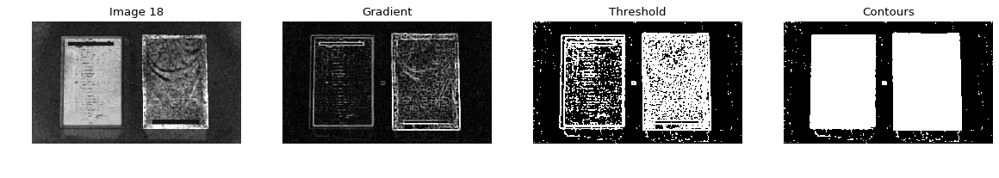

<Figure size 432x288 with 0 Axes>

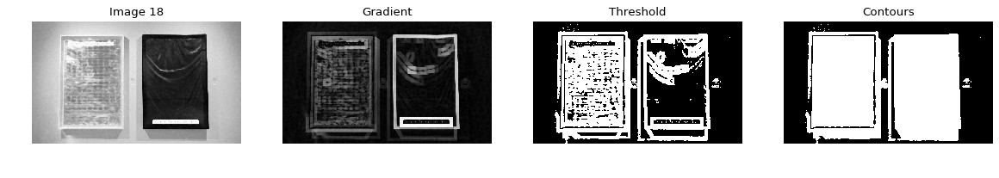

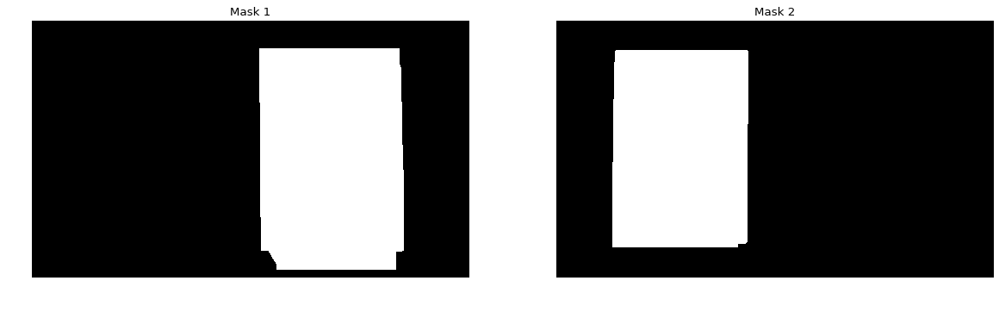

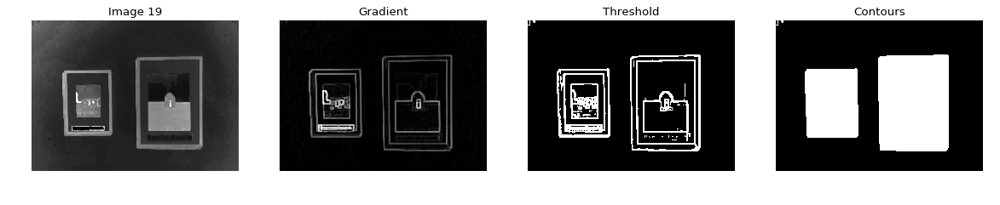

<Figure size 432x288 with 0 Axes>

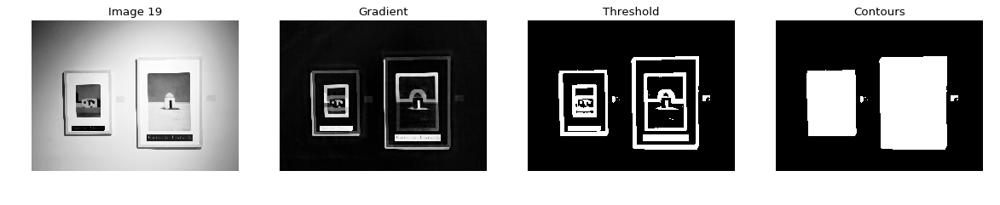

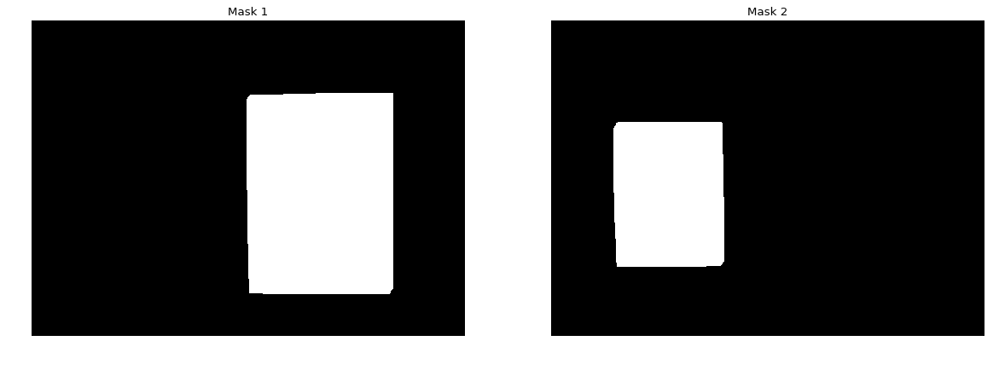

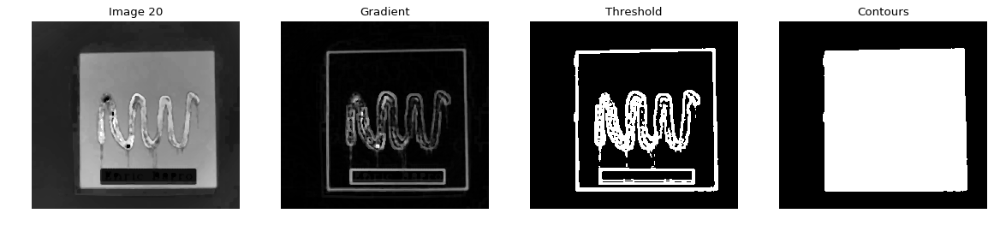

<Figure size 432x288 with 0 Axes>

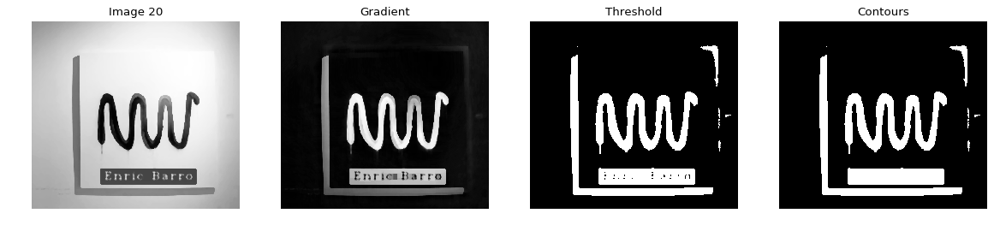

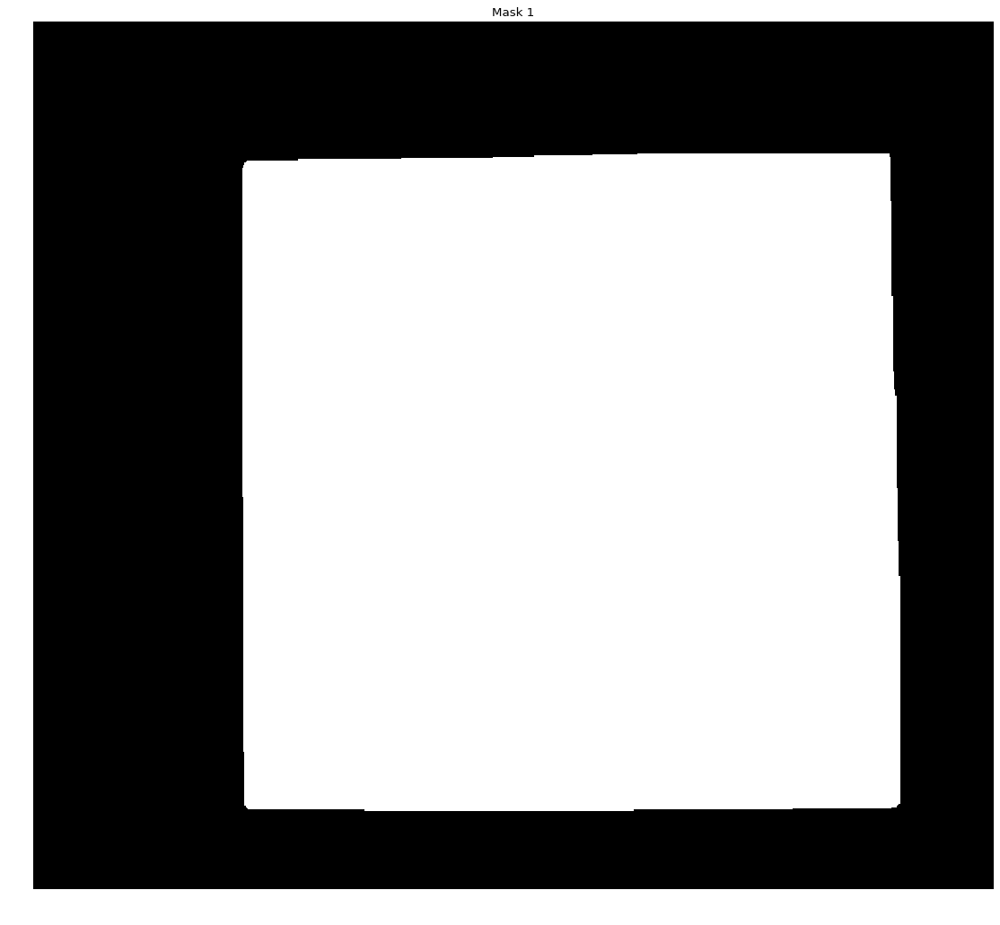

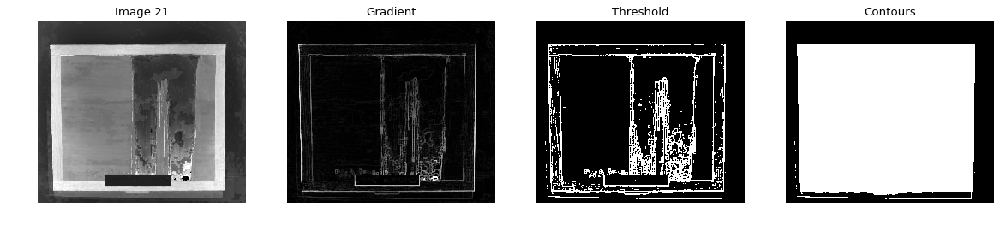

<Figure size 432x288 with 0 Axes>

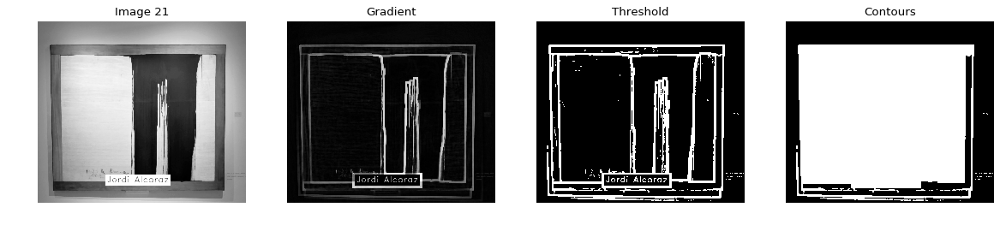

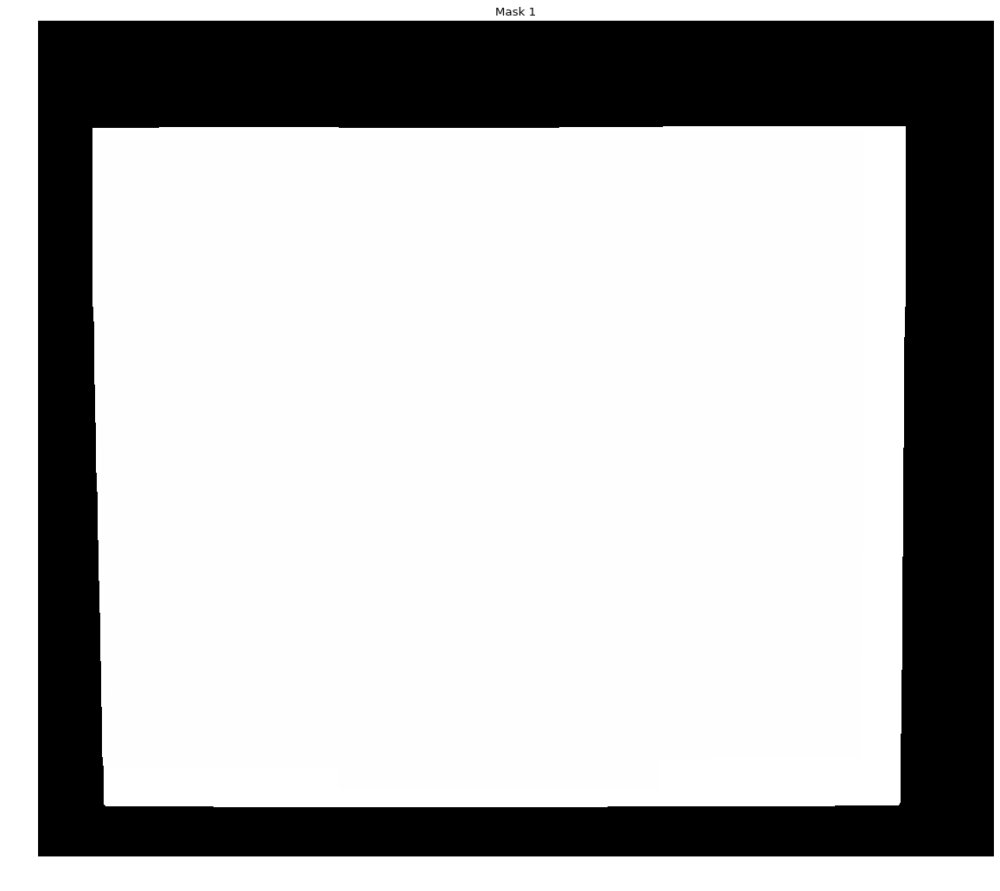

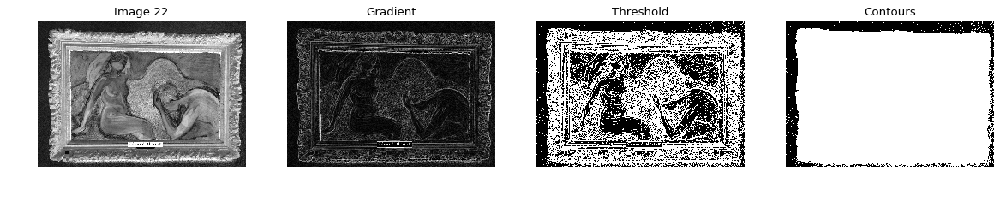

<Figure size 432x288 with 0 Axes>

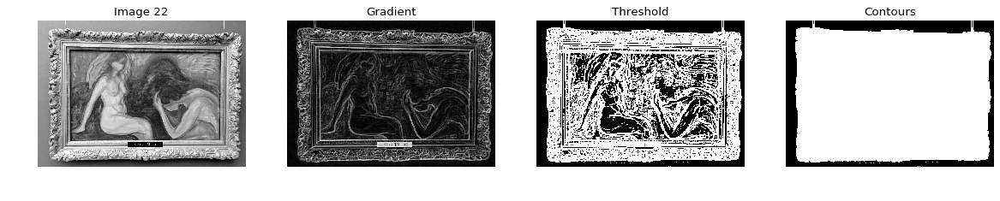

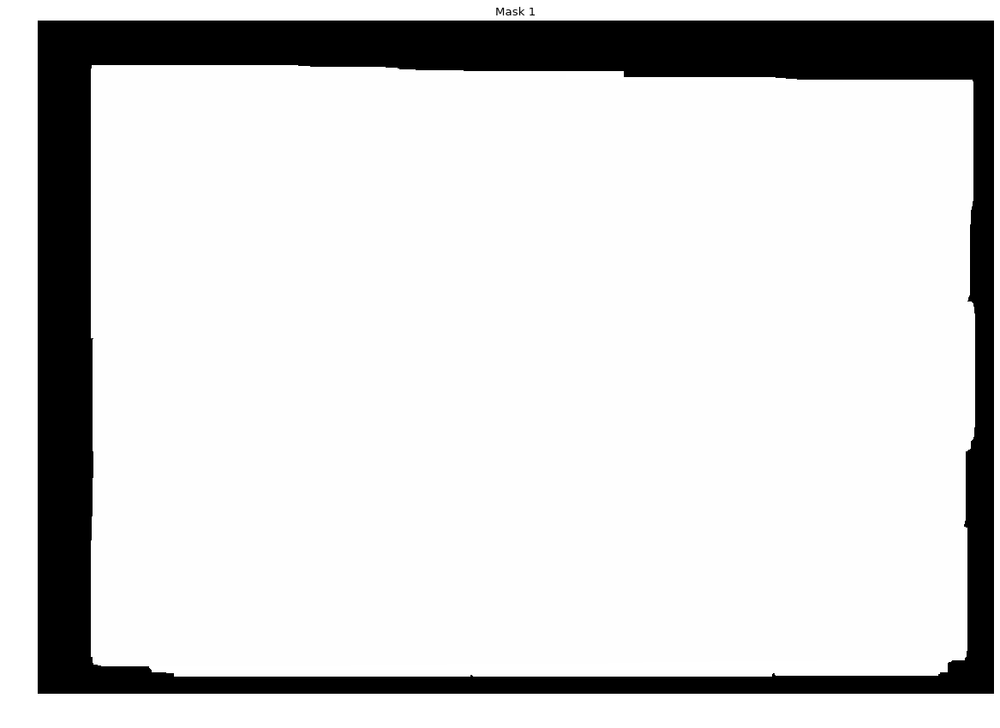

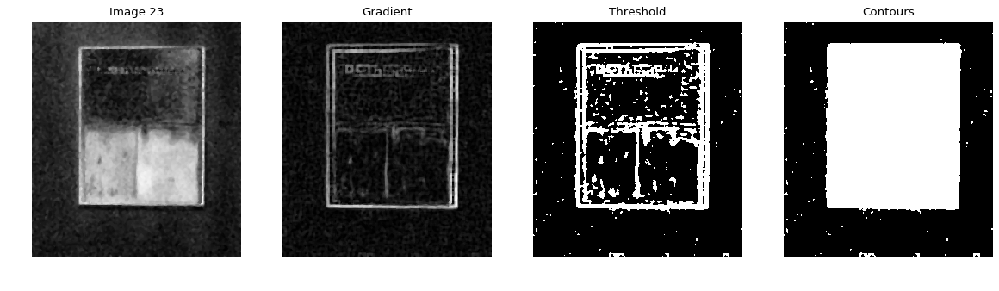

<Figure size 432x288 with 0 Axes>

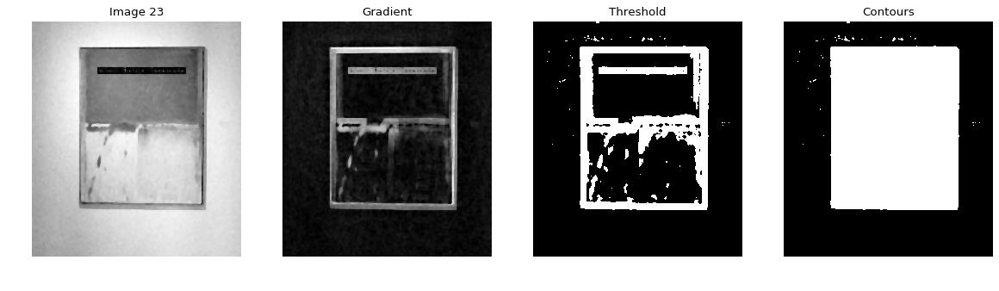

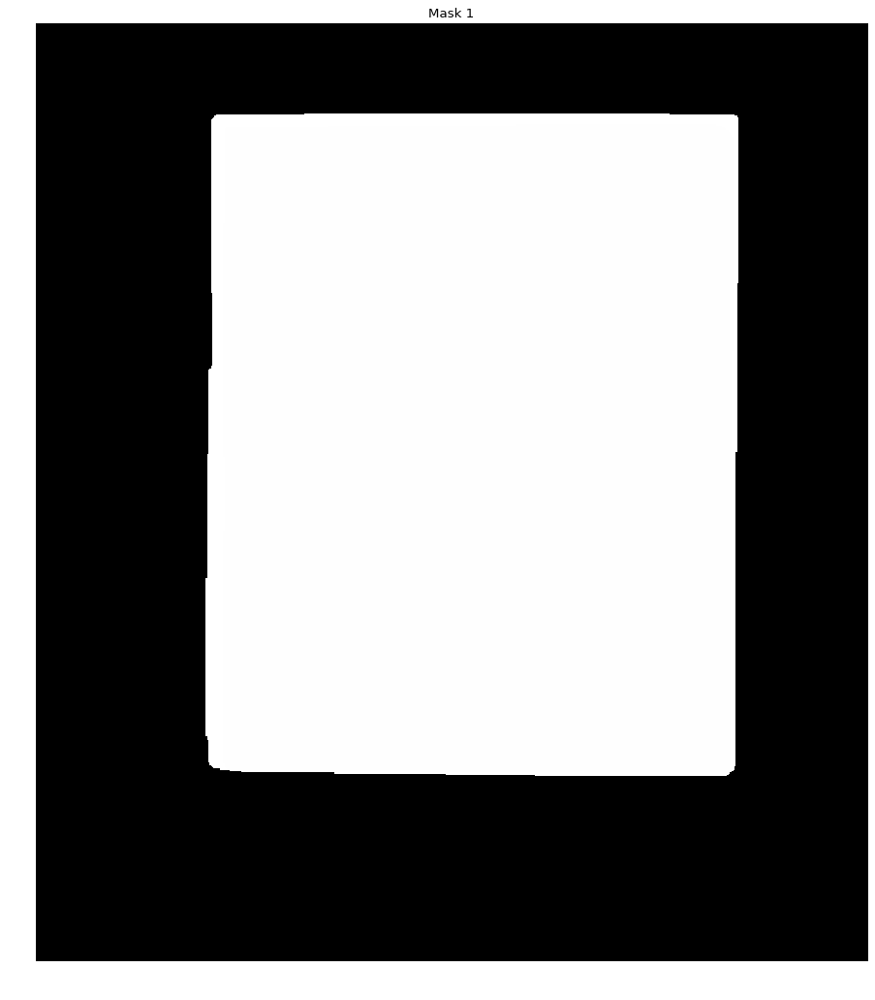

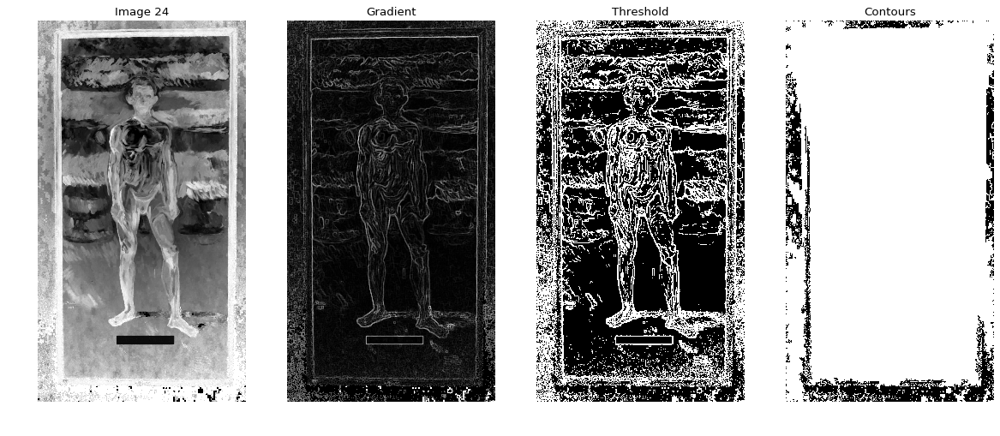

<Figure size 432x288 with 0 Axes>

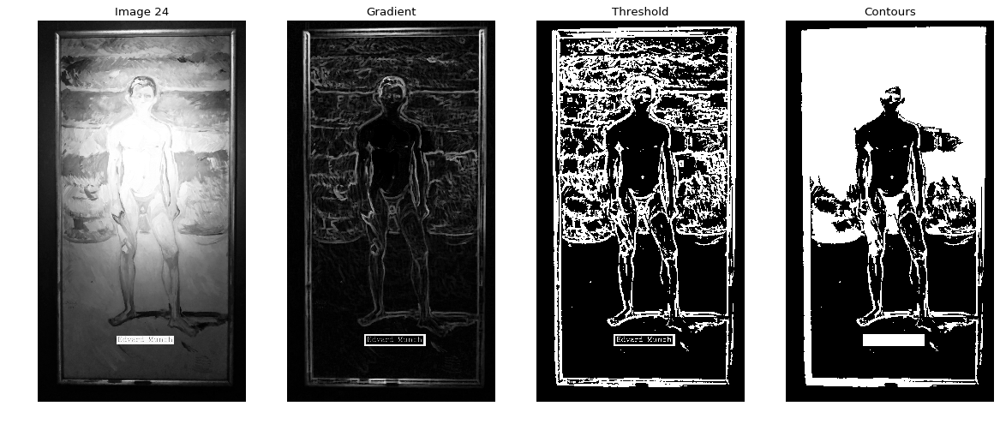

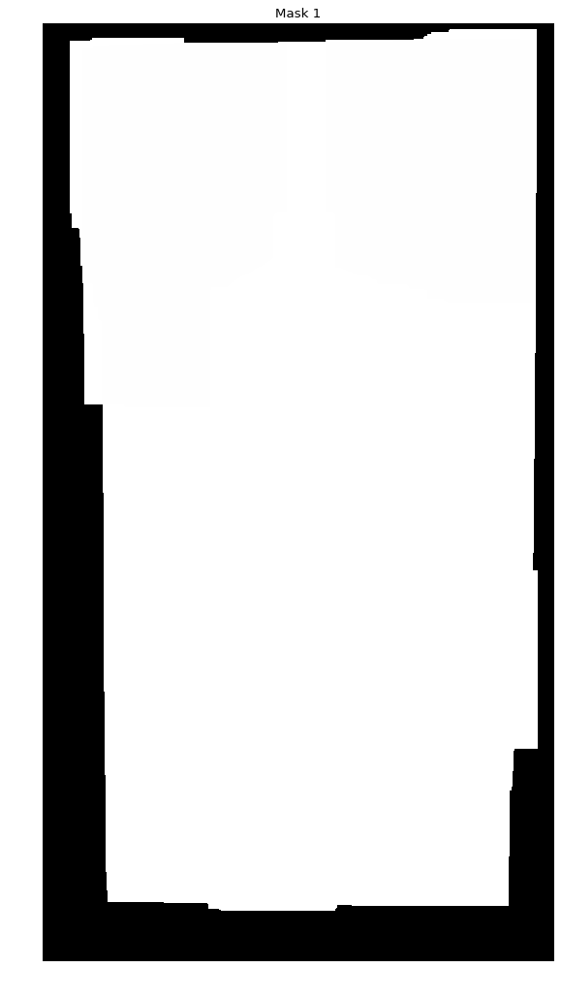

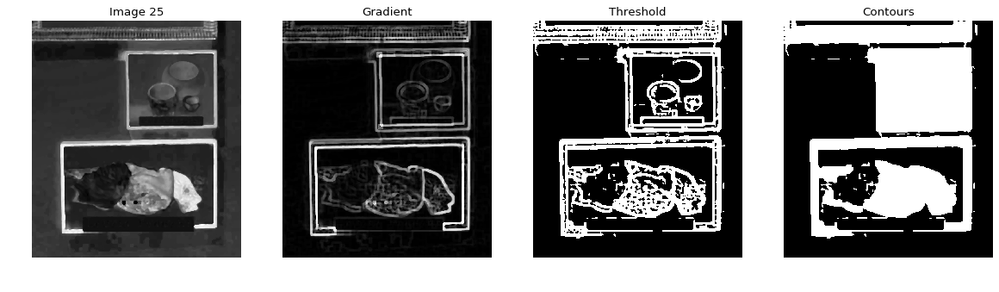

<Figure size 432x288 with 0 Axes>

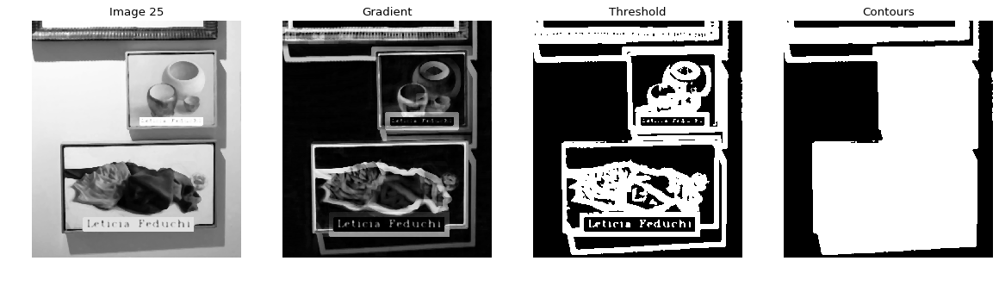

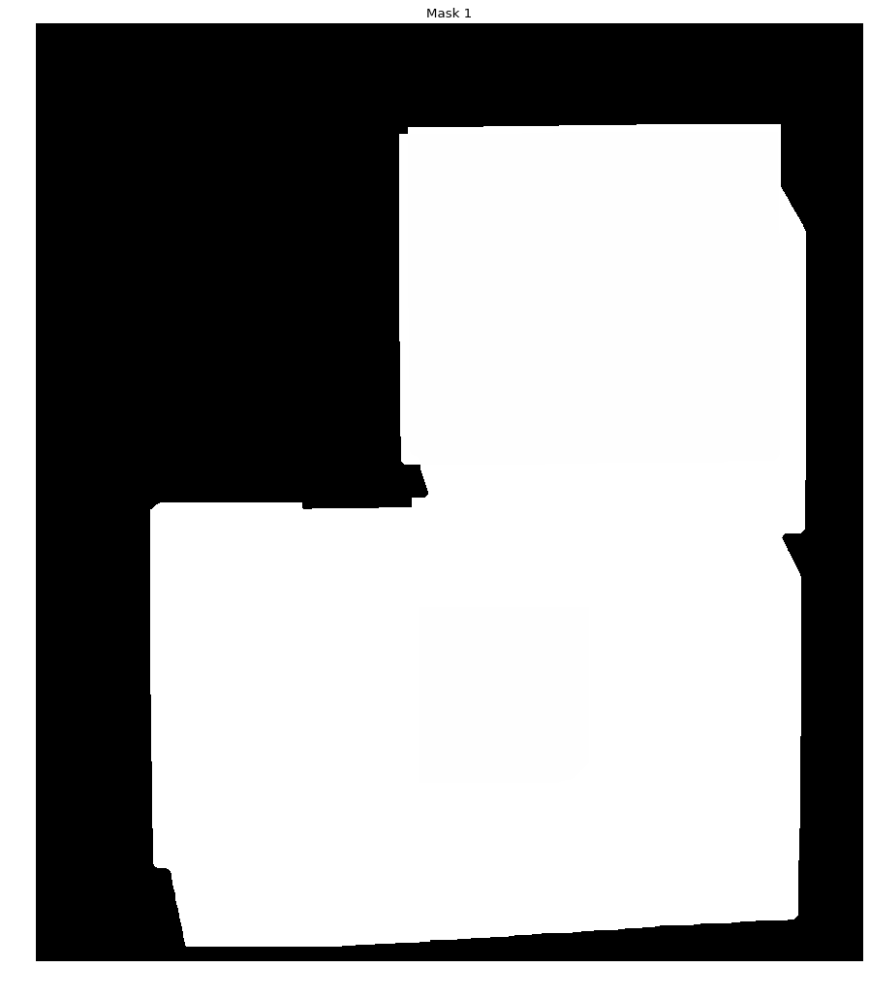

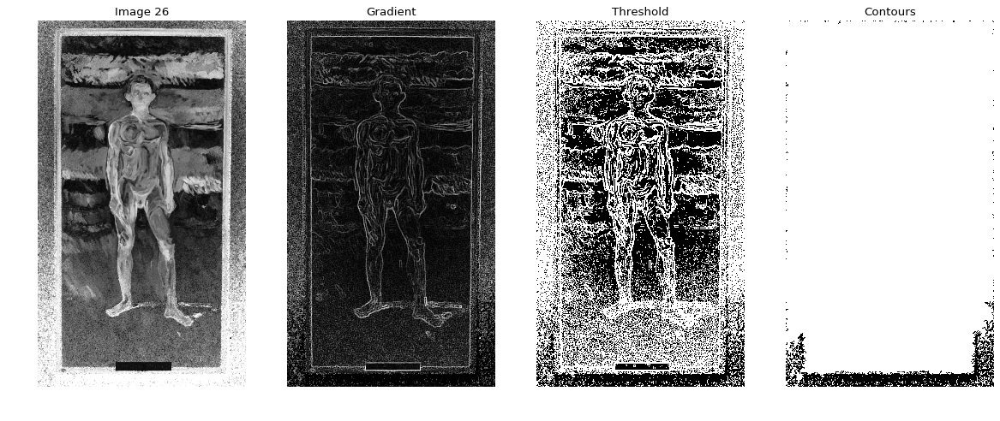

<Figure size 432x288 with 0 Axes>

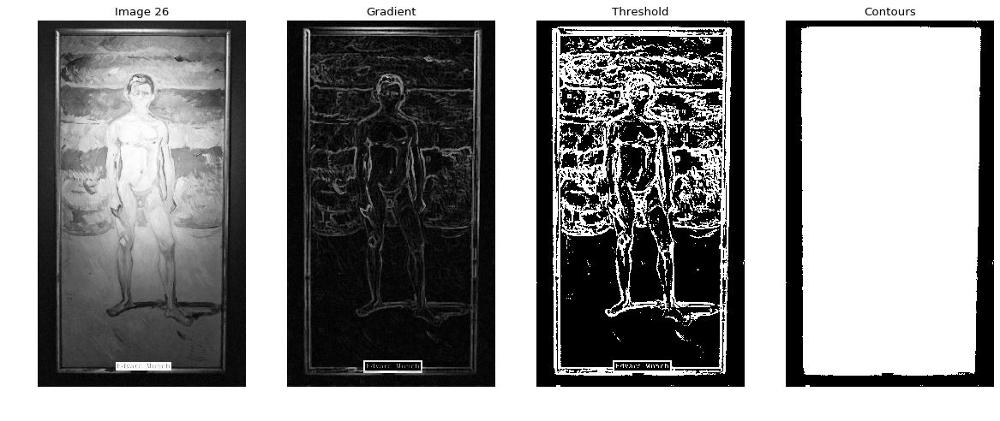

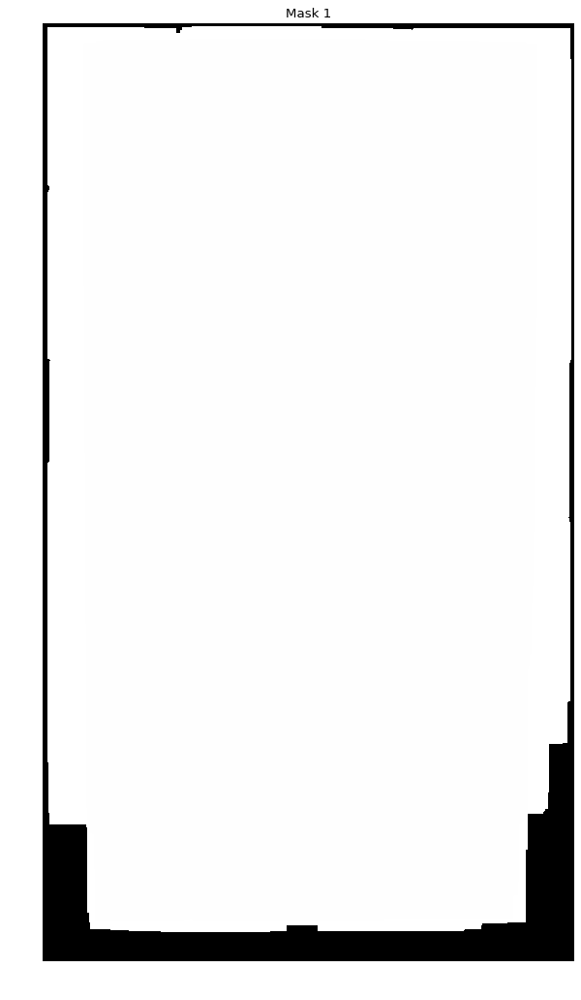

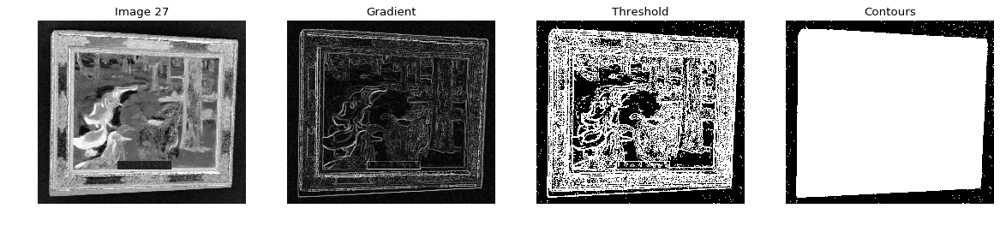

<Figure size 432x288 with 0 Axes>

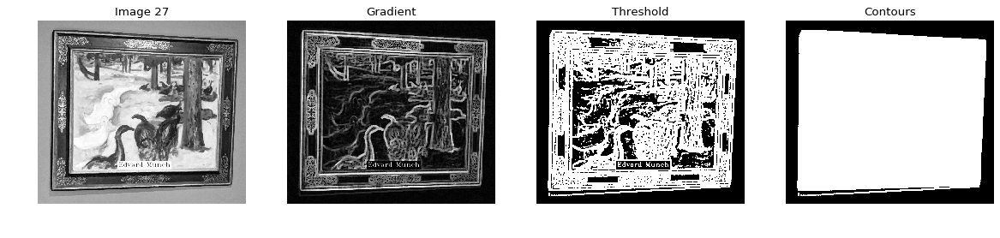

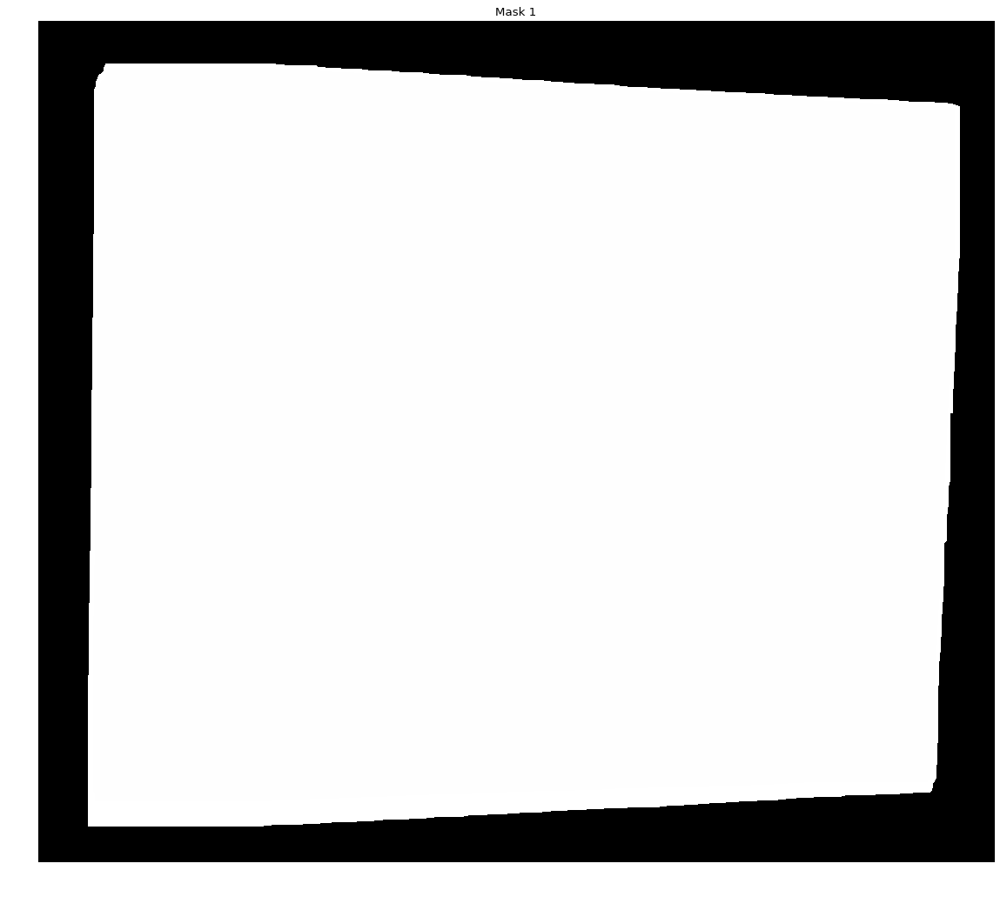

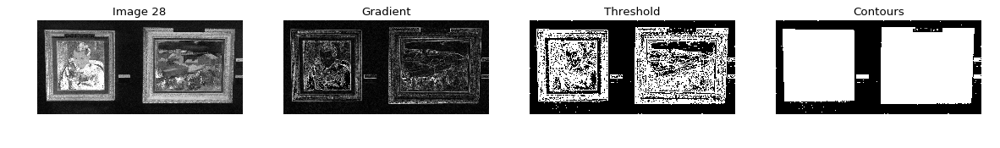

<Figure size 432x288 with 0 Axes>

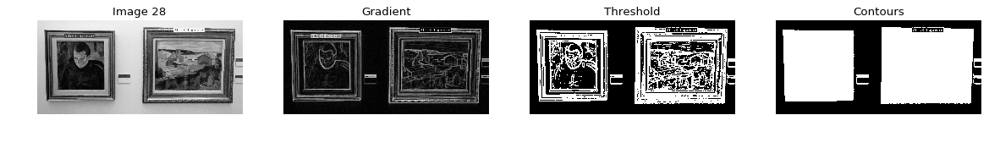

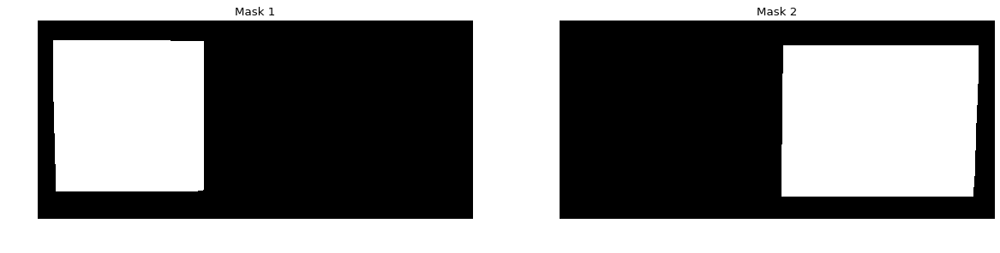

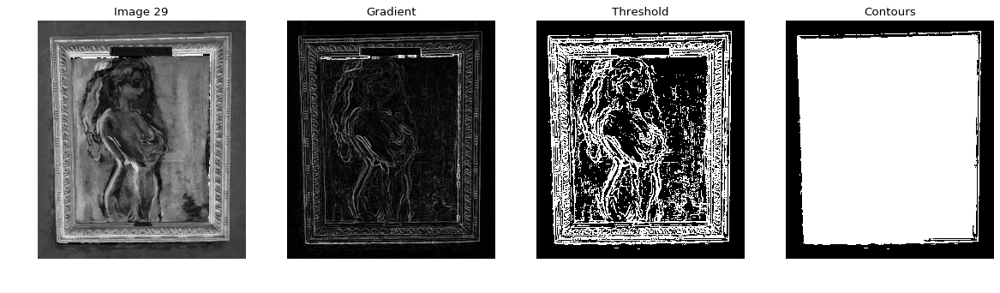

<Figure size 432x288 with 0 Axes>

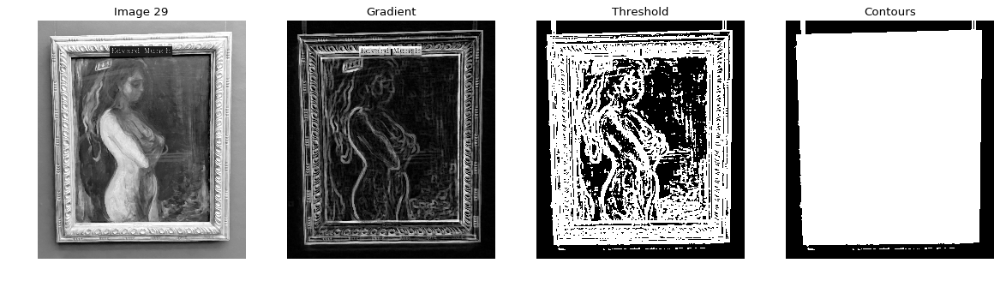

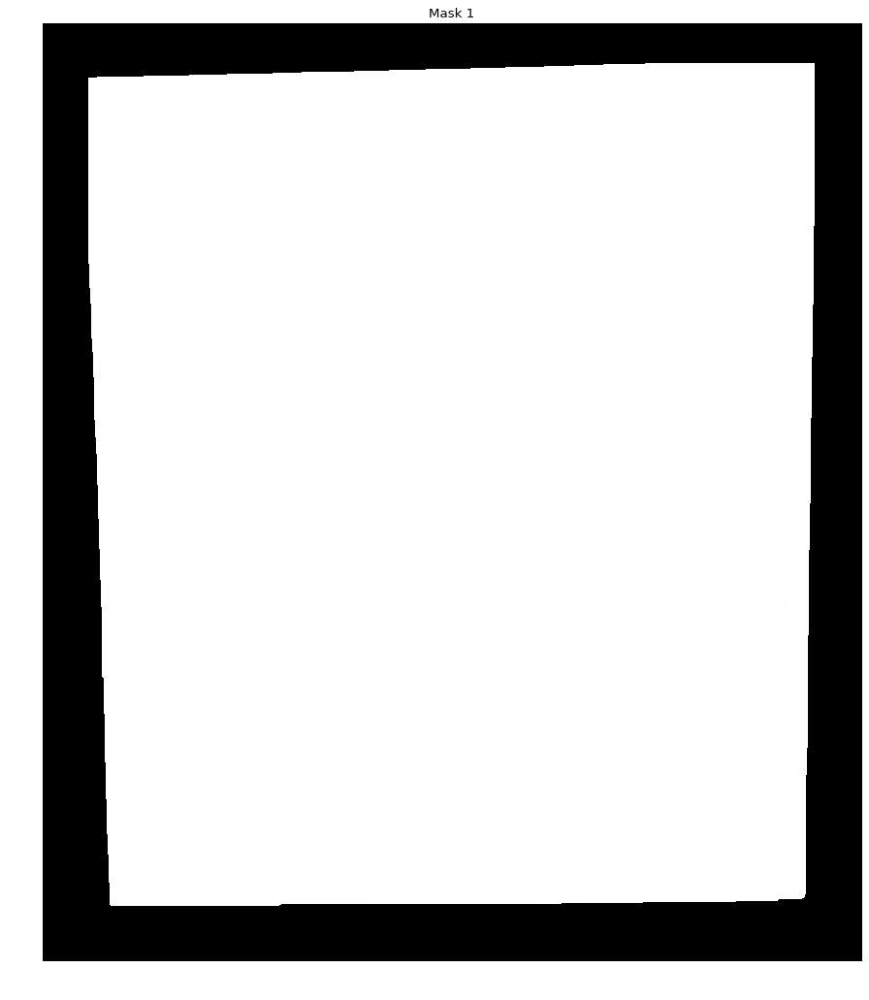

In [149]:
queries = []
fscore = []
QUERY_SET = 'qsd3_w3'
img_bbdd = []

qs_l = '../qs/' + QUERY_SET + '/*.jpg'

i=0
j=0

for f in sorted(glob.glob(qs_l)):
    # Read images
    name = os.path.splitext(os.path.split(f)[1])[0]
    img = cv.imread(f, cv.IMREAD_COLOR)
    img_bbdd.append(img)
    
    '''
    img = cv.cvtColor(img, cv.COLOR_BGR2LAB)
    img_median = cv.medianBlur(img,5)

    showImagesHorizontally([img_median[:,:,0], img_median[:,:,1], img_median[:,:,2]],["L", "A", "B"])
    showImagesHorizontally([cv.cvtColor(img, cv.COLOR_LAB2RGB),cv.cvtColor(img_median, cv.COLOR_LAB2RGB)],["Image", "Filtered image"])
    img = (img_median[:,:,0] + img_median[:,:,1] + img_median[:,:,2]) / 3
    '''
    
    img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    img_median = cv.medianBlur(img,3)
    img_median = cv.medianBlur(img_median,9)
    '''
    showImagesHorizontally([img_median[:,:,0], img_median[:,:,1], img_median[:,:,2]],["H | Min: " + str(np.min(img_median[:,:,0])) +" Max: " + str(np.max(img_median[:,:,0])),
                                                                                      "S | Min: " + str(np.min(img_median[:,:,1])) +" Max: " + str(np.max(img_median[:,:,1])),
                                                                                      "V | Min: " + str(np.min(img_median[:,:,2])) +" Max: " + str(np.max(img_median[:,:,2]))])
    showImagesHorizontally([cv.cvtColor(img, cv.COLOR_HSV2RGB),cv.cvtColor(img_median, cv.COLOR_HSV2RGB)],["Image " + str(j), "Filtered image"])
    '''
    #FUNCTION STARTS
    # Compute masks in two channels of the image
    img1 = img_median[:,:,1]
    img2 = img_median[:,:,2]

    '''
    # Compute morphological gradient (dilation - erosion)
    kernel = np.ones((20,20),np.uint8)
    img_gradient = cv.morphologyEx(img, cv.MORPH_GRADIENT, kernel)
    '''

    height, width = np.shape(img1)

    # Compute morphological gradient by dilation (keep inner edges to remove wall posters)
    kernel = np.ones((20,20),np.uint8)
    img_dilation1 = cv.dilate(img1,kernel,iterations = 1)
    img_gradient1 = img_dilation1 - img1
    
    kernel = np.ones((40,40),np.uint8)
    img_dilation2 = cv.dilate(img2,kernel,iterations = 1)
    img_gradient2 = img_dilation2 - img2

    # Thresholding
    _,img_th1 = cv.threshold(img_gradient1, 20, 255, cv.THRESH_BINARY)
    _,img_th2 = cv.threshold(img_gradient2, 20, 255, cv.THRESH_BINARY)
    
    # Computing external contours
    contours1, _ = cv.findContours(img_th1, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    img_contour1 = np.zeros_like(img_th1)
    cv.drawContours(img_contour1, contours1, -1, 255, -1)
    
    contours2, _ = cv.findContours(img_th2, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    img_contour2 = np.zeros_like(img_th2)
    cv.drawContours(img_contour2, contours2, -1, 255, -1)

    # Opening to remove wall posters & others according to the image size
    size_h = round((1/6)*height)
    size_w = round((1/6)*width)
    kernel = np.ones((size_h,size_w),np.uint8)
    
    mask1 = cv.morphologyEx(img_contour1, cv.MORPH_OPEN, kernel)
    mask2 = cv.morphologyEx(img_contour2, cv.MORPH_OPEN, kernel)
    
    # Avoid all zeros image
    if(mask1.any()==0 and mask2.any()==0):
        mask = img_contour1
    else:
        mask = mask1 + mask2
    
    # Save mask
    cv.imwrite('masks/' + name + '.png', mask)

     # Read ground truth
    g_t = cv.imread('../qs/' + QUERY_SET + '/' + name + '.png', cv.IMREAD_COLOR)
    g_t = cv.cvtColor(g_t, cv.COLOR_BGR2GRAY)

    # Compute evaluation metrics
    pixelTP, pixelFP, pixelFN, pixelTN = performance_accumulation_pixel(mask,g_t)
    pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity = performance_evaluation_pixel(pixelTP, pixelFP, pixelFN, pixelTN)
    F1 = 2*pixel_precision*pixel_sensitivity/(pixel_precision+pixel_sensitivity)

    eval_metrics = [pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity, F1]
    '''
    print("Precision: "+str(pixel_precision))
    print("Accuracy: "+str(pixel_accuracy))
    print("Specificity: "+str(pixel_specificity))
    print("Recall (sensitivity): "+str(pixel_sensitivity))
    print("F1: "+str(F1))
    '''

    
    
    # DETECT IF THERE ARE TWO IMAGES
    # First method: check if the central mask is black
    '''
    central_column = round(width/2)
    central_column_mean = np.mean(mask[:,central_column:central_column+1])

    # If central column is not zero, analyze some extra columns
    # From 0.25 to 0.75 of the image, with a step of 100px
    if central_column_mean != 0:
        for i in range(round(0.5*(width/2)), round(1.5*(width/2)), 100):
            central_column_mean = np.mean(mask[:,i:i+1])
            if (central_column_mean == 0): # If found, exit for and keep central_column
                central_column = i
                break

    # If after the second attempt two masks are detected 
    if central_column_mean == 0:
        # Generate white masks
        mask_left = np.ones((height,width),np.uint8)
        mask_right = np.ones((height,width),np.uint8)

        # Compute
        mask_left[:,central_column:width] = 0
        mask_right[:,0:central_column] = 0
        mask_left = mask_left*mask
        mask_right = mask_right*mask
        bg_mask = [mask_left, mask_right]
        
        # If one mask is black, keep only the correct one
        if mask_left.any()==0:
            bg_mask = [mask_right]
        if mask_right.any()==0:
            bg_mask = [mask_left]

    else:
        bg_mask= [mask]
    '''
    # Second method: detect contours
    contours, hier = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)
    
    #One mask
    if(np.shape(hier)[1] == 1):
        bg_mask= [mask]
    if(np.shape(hier)[1] == 2):
        mask_right = np.zeros_like(mask)
        mask_left = np.zeros_like(mask)
        cv.fillPoly(mask_right, pts =[contours[0]], color=(255,255,255))
        cv.fillPoly(mask_left, pts =[contours[1]], color=(255,255,255))
        bg_mask = [mask_left, mask_right]    
    
    
    # Final de funció 
    showImagesHorizontally([img1,img_gradient1,img_th1,img_contour1],["Image " + str(j), "Gradient","Threshold","Contours"])
    figure()
    showImagesHorizontally([img2,img_gradient2,img_th2,img_contour2],["Image " + str(j), "Gradient","Threshold","Contours"])

    showImagesHorizontally(bg_mask,["Mask 1", "Mask 2"])
    
    fscore.append(F1)
    
    j = j+1

print('F-measure: ' + str(np.mean(fscore)))

In [71]:
def compute_best(p1,p2,p3,p4):
    queries = []
    fscore = []
    QUERY_SET = 'qsd2_w3'
    img_bbdd = []

    qs_l = '../qs/' + QUERY_SET + '/*.jpg'

    i=0
    j=0

    for f in sorted(glob.glob(qs_l)):
        # Read images
        name = os.path.splitext(os.path.split(f)[1])[0]
        img = cv.imread(f, cv.IMREAD_COLOR)
        img_bbdd.append(img)

        '''
        img = cv.cvtColor(img, cv.COLOR_BGR2LAB)
        img_median = cv.medianBlur(img,5)

        showImagesHorizontally([img_median[:,:,0], img_median[:,:,1], img_median[:,:,2]],["L", "A", "B"])
        showImagesHorizontally([cv.cvtColor(img, cv.COLOR_LAB2RGB),cv.cvtColor(img_median, cv.COLOR_LAB2RGB)],["Image", "Filtered image"])
        img = (img_median[:,:,0] + img_median[:,:,1] + img_median[:,:,2]) / 3
        '''

        img = cv.cvtColor(img, cv.COLOR_BGR2HSV)
        img_median = cv.medianBlur(img,3)
        img_median = cv.medianBlur(img_median,9)

        img1 = img_median[:,:,1]
        img2 = img_median[:,:,2]

        '''
        # Compute morphological gradient (dilation - erosion)
        kernel = np.ones((20,20),np.uint8)
        img_gradient = cv.morphologyEx(img, cv.MORPH_GRADIENT, kernel)
        '''

        #FUNCTION STARTS

        height, width = np.shape(img1)

        # Compute morphological gradient by dilation (keep inner edges to remove wall posters)
        kernel = np.ones((p1,p1),np.uint8)
        img_dilation1 = cv.dilate(img1,kernel,iterations = 1)
        img_gradient1 = img_dilation1 - img1

        kernel = np.ones((p2,p2),np.uint8)
        img_dilation2 = cv.dilate(img2,kernel,iterations = 1)
        img_gradient2 = img_dilation2 - img2

        # Thresholding
        _,img_th1 = cv.threshold(img_gradient1, p3, 255, cv.THRESH_BINARY)
        #_,img_th = cv.threshold(img_gradient, 0, 255, cv.THRESH_OTSU)
        _,img_th2 = cv.threshold(img_gradient2, p4, 255, cv.THRESH_BINARY)

        # Computing external contours
        contours1, _ = cv.findContours(img_th1, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
        img_contour1 = np.zeros_like(img_th1)
        cv.drawContours(img_contour1, contours1, -1, 255, -1)

        contours2, _ = cv.findContours(img_th2, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
        img_contour2 = np.zeros_like(img_th2)
        cv.drawContours(img_contour2, contours2, -1, 255, -1)

        # Opening to remove wall posters
        kernel = np.ones((20,200),np.uint8)
        mask1 = cv.morphologyEx(img_contour1, cv.MORPH_OPEN, kernel)

        kernel = np.ones((20,200),np.uint8)
        mask2 = cv.morphologyEx(img_contour2, cv.MORPH_OPEN, kernel)

        # Avoid all zeros image
        if(mask1.any()==0 and mask2.any()==0):
            mask = img_contour1
        else:
            mask = mask1 + mask2

        # Save mask
        cv.imwrite('masks/' + name + '.png', mask)

         # Read ground truth
        g_t = cv.imread('../qs/' + QUERY_SET + '/' + name + '.png', cv.IMREAD_COLOR)
        g_t = cv.cvtColor(g_t, cv.COLOR_BGR2GRAY)

        # Compute evaluation metrics
        pixelTP, pixelFP, pixelFN, pixelTN = performance_accumulation_pixel(mask,g_t)
        pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity = performance_evaluation_pixel(pixelTP, pixelFP, pixelFN, pixelTN)
        F1 = 2*pixel_precision*pixel_sensitivity/(pixel_precision+pixel_sensitivity)

        eval_metrics = [pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity, F1]
        '''
        print("Precision: "+str(pixel_precision))
        print("Accuracy: "+str(pixel_accuracy))
        print("Specificity: "+str(pixel_specificity))
        print("Recall (sensitivity): "+str(pixel_sensitivity))
        print("F1: "+str(F1))
        '''

        # DETECT IF THERE ARE TWO IMAGES
        # First method: check if the central mask is black
        central_column = round(width/2)
        central_column_mean = np.mean(mask[:,central_column:central_column+1])

        # If central column is not zero, analyze some extra columns
        # From 0.25 to 0.75 of the image, with a step of 100px
        if central_column_mean != 0:
            for i in range(round(0.5*(width/2)), round(1.5*(width/2)), 100):
                central_column_mean = np.mean(mask[:,i:i+1])
                if (central_column_mean == 0): # If found, exit for and keep central_column
                    central_column = i
                    break

        # If after the second attempt two masks are detected 
        if central_column_mean == 0:
            # Generate white masks
            mask_left = np.ones((height,width),np.uint8)
            mask_right = np.ones((height,width),np.uint8)

            # Compute
            mask_left[:,central_column:width] = 0
            mask_right[:,0:central_column] = 0
            mask_left = mask_left*mask
            mask_right = mask_right*mask
            bg_mask = [mask_left, mask_right]     

        else:
            bg_mask= [mask]


        fscore.append(F1)

        j = j+1

    return(np.mean(fscore))

In [ ]:
i=0
f_score = []
for p1 in range(10, 50, 10):
    for p2 in range(10, 50, 10):
        for p3 in range(8, 14, 2):
            for p4 in range(8, 18, 2):
                print(str(p1) + " | " + str(p2) + " | " + str(p3) + " | " + str(p4))
                f_score.append(compute_best(p1,p2,p3,p4))
                print(str(i) + " Fscore: " + str(f_score[i]))
                i = i+1

In [74]:
print(np.argmax(f_score))

56


0.768442982500368


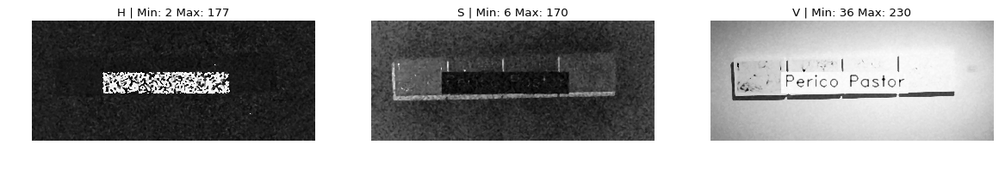

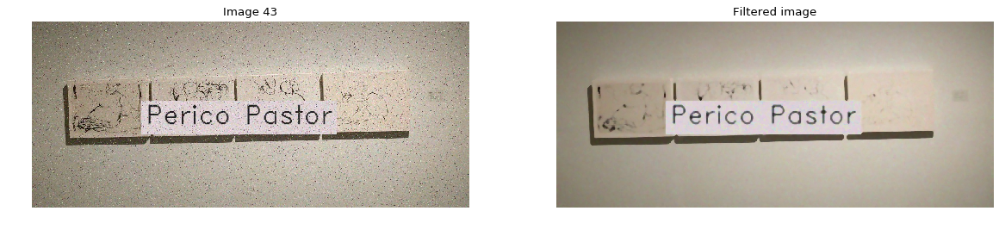

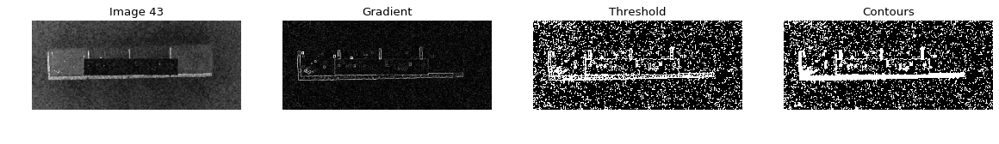

<Figure size 432x288 with 0 Axes>

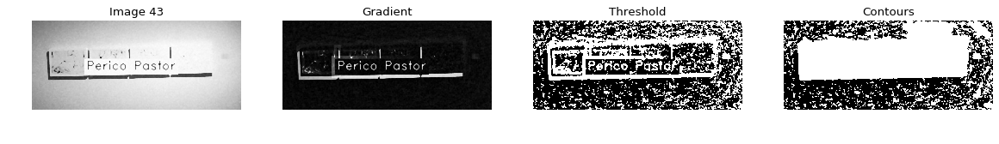

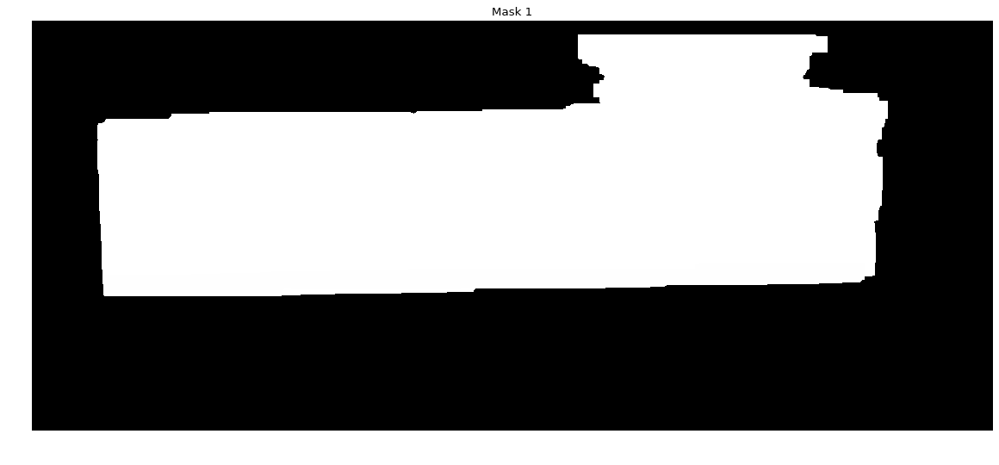

In [97]:
queries = []
fscore = []
i = 0

name = "00015"
img = cv.cvtColor(img_bbdd[15], cv.COLOR_BGR2HSV)
img_median = cv.medianBlur(img,3)
img_median = cv.medianBlur(img_median,9)

showImagesHorizontally([img_median[:,:,0], img_median[:,:,1], img_median[:,:,2]],["H | Min: " + str(np.min(img_median[:,:,0])) +" Max: " + str(np.max(img_median[:,:,0])),
                                                                                  "S | Min: " + str(np.min(img_median[:,:,1])) +" Max: " + str(np.max(img_median[:,:,1])),
                                                                                  "V | Min: " + str(np.min(img_median[:,:,2])) +" Max: " + str(np.max(img_median[:,:,2]))])
showImagesHorizontally([cv.cvtColor(img, cv.COLOR_HSV2RGB),cv.cvtColor(img_median, cv.COLOR_HSV2RGB)],["Image " + str(j), "Filtered image"])

img1 = img_median[:,:,1]
img2 = img_median[:,:,2]

'''
# Compute morphological gradient (dilation - erosion)
kernel = np.ones((20,20),np.uint8)
img_gradient = cv.morphologyEx(img, cv.MORPH_GRADIENT, kernel)
'''

#FUNCTION STARTS

height, width = np.shape(img1)

# Compute morphological gradient by dilation (keep inner edges to remove wall posters)
kernel = np.ones((10,10),np.uint8)
img_dilation1 = cv.dilate(img1,kernel,iterations = 1)
img_gradient1 = img_dilation1 - img1

kernel = np.ones((40,40),np.uint8)
img_dilation2 = cv.dilate(img2,kernel,iterations = 1)
img_gradient2 = img_dilation2 - img2

# Thresholding
_,img_th1 = cv.threshold(img_gradient1, 8, 255, cv.THRESH_BINARY)
#_,img_th = cv.threshold(img_gradient, 0, 255, cv.THRESH_OTSU)
_,img_th2 = cv.threshold(img_gradient2, 8, 255, cv.THRESH_BINARY)

# Computing external contours
contours1, _ = cv.findContours(img_th1, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
img_contour1 = np.zeros_like(img_th1)
cv.drawContours(img_contour1, contours1, -1, 255, -1)

contours2, _ = cv.findContours(img_th2, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
img_contour2 = np.zeros_like(img_th2)
cv.drawContours(img_contour2, contours2, -1, 255, -1)

# Opening to remove wall posters
kernel = np.ones((20,200),np.uint8)
mask1 = cv.morphologyEx(img_contour1, cv.MORPH_OPEN, kernel)

kernel = np.ones((20,200),np.uint8)
mask2 = cv.morphologyEx(img_contour2, cv.MORPH_OPEN, kernel)

# Avoid all zeros image
if(mask1.any()==0 and mask2.any()==0):
    mask = img_contour1
else:
    mask = mask1 + mask2

# Save mask
cv.imwrite('masks/' + name + '.png', mask)

 # Read ground truth
g_t = cv.imread('../qs/' + QUERY_SET + '/' + name + '.png', cv.IMREAD_COLOR)
g_t = cv.cvtColor(g_t, cv.COLOR_BGR2GRAY)

# Compute evaluation metrics
pixelTP, pixelFP, pixelFN, pixelTN = performance_accumulation_pixel(mask,g_t)
pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity = performance_evaluation_pixel(pixelTP, pixelFP, pixelFN, pixelTN)
F1 = 2*pixel_precision*pixel_sensitivity/(pixel_precision+pixel_sensitivity)

eval_metrics = [pixel_precision, pixel_accuracy, pixel_specificity, pixel_sensitivity, F1]
'''
print("Precision: "+str(pixel_precision))
print("Accuracy: "+str(pixel_accuracy))
print("Specificity: "+str(pixel_specificity))
print("Recall (sensitivity): "+str(pixel_sensitivity))
print("F1: "+str(F1))
'''

# DETECT IF THERE ARE TWO IMAGES
# First method: check if the central mask is black
central_column = round(width/2)
central_column_mean = np.mean(mask[:,central_column:central_column+1])

# If central column is not zero, analyze some extra columns
# From 0.25 to 0.75 of the image, with a step of 100px
if central_column_mean != 0:
    for i in range(round(0.5*(width/2)), round(1.5*(width/2)), 100):
        central_column_mean = np.mean(mask[:,i:i+1])
        if (central_column_mean == 0): # If found, exit for and keep central_column
            central_column = i
            break

# If after the second attempt two masks are detected 
if central_column_mean == 0:
    # Generate white masks
    mask_left = np.ones((height,width),np.uint8)
    mask_right = np.ones((height,width),np.uint8)

    # Compute
    mask_left[:,central_column:width] = 0
    mask_right[:,0:central_column] = 0
    mask_left = mask_left*mask
    mask_right = mask_right*mask
    bg_mask = [mask_left, mask_right]     

else:
    bg_mask= [mask]

# Final de funció 
showImagesHorizontally([img1,img_gradient1,img_th1,img_contour1],["Image " + str(j), "Gradient","Threshold","Contours"])
figure()
showImagesHorizontally([img2,img_gradient2,img_th2,img_contour2],["Image " + str(j), "Gradient","Threshold","Contours"])

showImagesHorizontally(bg_mask,["Mask 1", "Mask 2"])

print(F1)

j = j+1


